<a href="https://colab.research.google.com/github/PouyaSonej/ClothSegmentation/blob/main/Segmentation_clothes_9classes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports and Global Variables

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -q git+https://github.com/tensorflow/examples.git

    Running setup.py install for tensorflow-examples ... done
  DEPRECATION: tensorflow-examples was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.


In [ ]:
%cd drive/MyDrive/DL_projects_colab/Clothes_segmentation/

/content/drive/MyDrive/DL_projects_colab/Clothes_segmentation


In [ ]:
import os
import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt
import math
from pathlib import Path
import re
from skimage import measure
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score
import matplotlib as mpl
import tqdm
import tensorflow as tf
from tensorflow_examples.models.pix2pix import pix2pix
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import normalize
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda

In [ ]:
images_path = "./data/png_images/IMAGES"
masks_path = "./data/png_masks/MASKS"

In [ ]:
OUTPUT_CHANNELS = 9
classes = {'bg':0, 'accessories': 1,  'bag': 2,  'clothes': 3, 'shoes': 4, 'glasses': 5,  'hair': 6,  'hat': 7,  'skin': 8}
convs = {0: 0, 1: 1, 2: 2, 3: 3, 4: 3, 5: 3, 6: 3, 7: 4, 8: 3, 9: 1, 10: 3, 11: 3, 12: 4, 13: 3, 14: 3, 15: 1, 16: 4, 17: 5, 18: 3, 19: 6, 20: 7, 21: 4, 22: 3, 23: 3, 24: 3, 25: 3, 26: 3, 27: 3, 28: 4, 29: 1, 30: 3, 31: 3, 32: 4, 33: 3, 34: 1, 35: 3, 36: 4, 37: 3, 38: 3, 39: 4, 40: 3, 41: 8, 42: 3, 43: 4, 44: 3, 45: 3, 46: 3, 47: 5, 48: 3, 49: 3, 50: 3, 51: 3, 52: 3, 53: 3, 54: 3, 55: 3, 56: 3, 57: 1, 58: 4}

# Load Data

In [ ]:
def standardize(x):
    x = np.array(x, dtype='float64')
    x -= np.min(x)
    x /= np.percentile(x, 98)
    x[x > 1] = 1
    return x

def preprocessing(img):
    image = np.array(img)
    gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    image = np.zeros_like(image)
    image[:,:,0] = gray
    image[:,:,1] = gray
    image[:,:,2] = gray
    image = standardize(image)
    return image

In [ ]:
#Capture training image info as a list
images_paths = []
masks_paths = []

for imgname in os.listdir(images_path):
  images_paths.append(os.path.join(images_path,imgname))

for imgname in os.listdir(masks_path):
  masks_paths.append(os.path.join(masks_path,imgname))

In [ ]:
print(images_paths[:5])

['./data/png_images/IMAGES/img_0015.png', './data/png_images/IMAGES/img_0002.png', './data/png_images/IMAGES/img_0005.png', './data/png_images/IMAGES/img_0016.png', './data/png_images/IMAGES/img_0013.png']


In [ ]:
print(masks_paths[:5])

['./data/png_masks/MASKS/seg_0895.png', './data/png_masks/MASKS/seg_0936.png', './data/png_masks/MASKS/seg_0008.png', './data/png_masks/MASKS/seg_0285.png', './data/png_masks/MASKS/seg_0333.png']


In [ ]:
images_paths.sort()
masks_paths.sort()

In [ ]:
#Resizing images, if needed
SIZE_X = 256
SIZE_Y = 256
n_classes=9 #Number of classes for segmentation

#Capture training image info as a list
train_images = []
train_masks = []

for imgpath in tqdm.tqdm(images_paths):
  img = cv2.imread(imgpath)
  img = cv2.resize(img, (SIZE_Y, SIZE_X))
  img = preprocessing(img)
  train_images.append(img)


for maskpath in tqdm.tqdm(masks_paths):
  mask0 = cv2.imread(maskpath, 0)
  mask1 = cv2.resize(mask0, (SIZE_Y, SIZE_X), interpolation = cv2.INTER_NEAREST)  #Otherwise ground truth changes due to interpolation
  for oldnum in range(0,59):
      new_num = convs[oldnum]
      mask1[mask1==oldnum]=new_num
  train_masks.append(mask1)

train_images = np.array(train_images)
train_masks = np.array(train_masks)

X_train, X_val, y_train, y_val = train_test_split(train_images, train_masks, test_size = 0.10, shuffle=True, random_state = 1)
print("Class values: ", np.unique(y_train))

100%|██████████| 1000/1000 [12:53<00:00,  1.29it/s]


Class values:  [0 1 2 3 4 5 6 7 8]


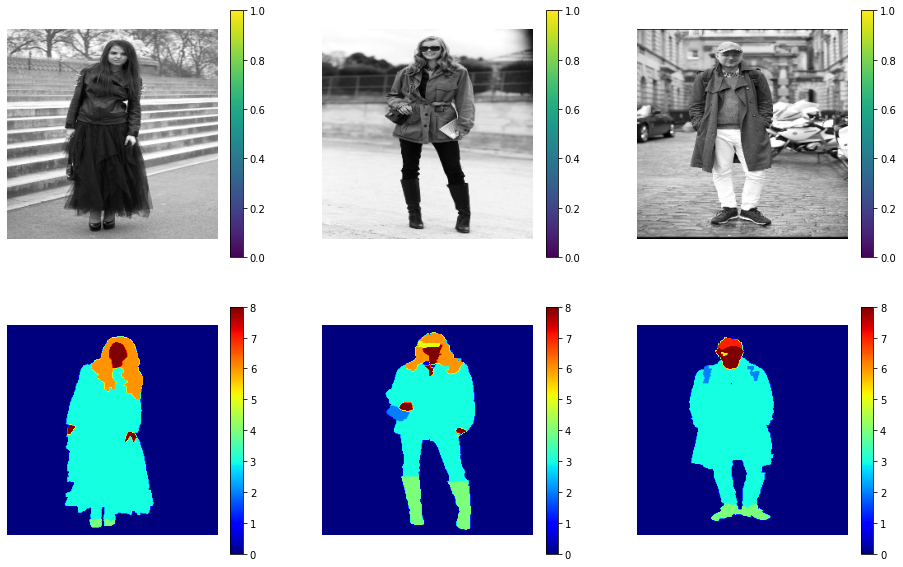

In [ ]:
NORM = mpl.colors.Normalize(vmin=0, vmax=8)

plt.figure(figsize=(16,10))
for i in range(1,4):
    plt.subplot(2,3,i)
    img = train_images[i]
    plt.imshow(img)
    plt.colorbar()
    plt.axis('off')

for i in range(4,7):
    plt.subplot(2,3,i)
    img = np.squeeze(train_masks[i-3])
    plt.imshow(img, cmap='jet', norm=NORM)
    plt.colorbar()
    plt.axis('off')
plt.show()

# Define Model

## Method1

In [ ]:
def unet_model(output_channels):
    IMG_HEIGHT = X_train.shape[1]
    IMG_WIDTH  = X_train.shape[2]
    IMG_CHANNELS = X_train.shape[3]

    base_model = MobileNetV2(input_shape=[IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS], include_top=False)

    # Use the activations of these layers
    layer_names = [
        'block_1_expand_relu',   # 64x64
        'block_3_expand_relu',   # 32x32
        'block_6_expand_relu',   # 16x16
        'block_13_expand_relu',  # 8x8
        'block_16_project',      # 4x4
    ]

    base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

    # Create the feature extraction model
    down_stack = Model(inputs=base_model.input, outputs=base_model_outputs)

    down_stack.trainable = False

    up_stack = [
        pix2pix.upsample(512, 3),  # 4x4 -> 8x8
        pix2pix.upsample(256, 3),  # 8x8 -> 16x16
        pix2pix.upsample(128, 3),  # 16x16 -> 32x32
        pix2pix.upsample(64, 3),   # 32x32 -> 64x64
    ]

    inputs = Input(shape=[IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS])

    # Downsampling through the model
    skips = down_stack(inputs)
    x = skips[-1]
    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        concat = Concatenate()
        x = concat([x, skip])

    # This is the last layer of the model
    last = Conv2DTranspose(OUTPUT_CHANNELS, 3, strides=2, padding='same')  #64x64 -> 128x128

    x = last(x)

    return Model(inputs=inputs, outputs=x)

In [ ]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]


def show_predictions(epoch, dataset=None, num=50):
  if dataset:

    for image, mask in dataset.take(num):
        pred_mask = model.predict(image)
        plt.figure(figsize=(15, 10))
        plt.subplot(231)
        plt.title('Testing Image')
        plt.imshow(image[0], cmap='gray')
        plt.subplot(232)
        plt.title('Ground Truth')
        plt.imshow(mask[0], cmap='jet')
        plt.subplot(233)
        plt.title('Prediction on test image')
        plt.imshow(create_mask(pred_mask), cmap='jet')

        plt.savefig(f"results/mask_{str(ii)}.png")

        plt.show()
  else:
      fig = plt.figure(figsize=(12, 12))
      fig.suptitle(f"\n Epoch: {str(epoch)}\n", fontsize=16)

      plt.subplot(331)
      plt.title('Testing Image')
      plt.imshow(train_images[num], cmap='gray')
      plt.subplot(332)
      plt.title('Ground Truth')
      plt.imshow(train_masks[num], cmap='jet')
      plt.subplot(333)
      plt.title('Prediction on test image')
      plt.imshow(create_mask(model.predict(train_images[num][tf.newaxis, ...]))[:,:,0], cmap='jet')

      plt.subplot(334)
      plt.imshow(train_images[num+16], cmap='gray')
      plt.subplot(335)
      plt.imshow(train_masks[num+16], cmap='jet')
      plt.subplot(336)
      plt.imshow(create_mask(model.predict(train_images[num+16][tf.newaxis, ...]))[:,:,0], cmap='jet')
      plt.subplot(337)
      plt.imshow(train_images[num+14], cmap='gray')
      plt.subplot(338)
      plt.imshow(train_masks[num+14], cmap='jet')
      plt.subplot(339)
      plt.imshow(create_mask(model.predict(train_images[num+14][tf.newaxis, ...]))[:,:,0], cmap='jet')

      #plt.savefig(f"results/mask_{str(num+100)}_{str(epoch)}.png")

      plt.show()

In [ ]:
model = unet_model(OUTPUT_CHANNELS)
model.compile(optimizer='adam',
              loss=SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])   #

              metrics=[tf.keras.metrics.MeanIoU(num_classes=9)])

9406464/9406464 [==============================] - 0s 0us/step


# Train

Epoch 1/50
1/1 [==============================] - 0s 18ms/step


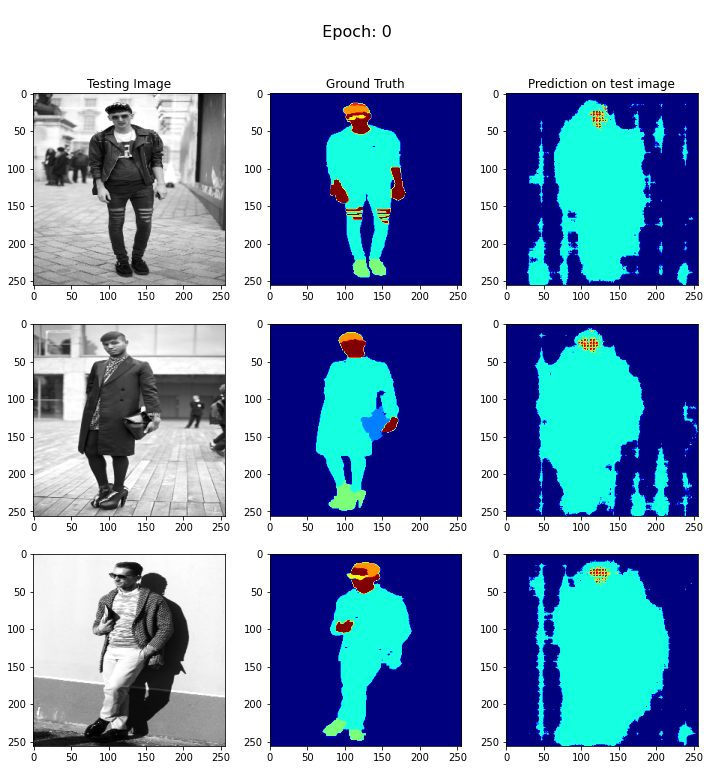


Sample Prediction after epoch 1

57/57 [==============================] - 22s 191ms/step - loss: 0.5228 - accuracy: 0.8546 - val_loss: 1.3384 - val_accuracy: 0.7643
Epoch 2/50
1/1 [==============================] - 0s 21ms/step


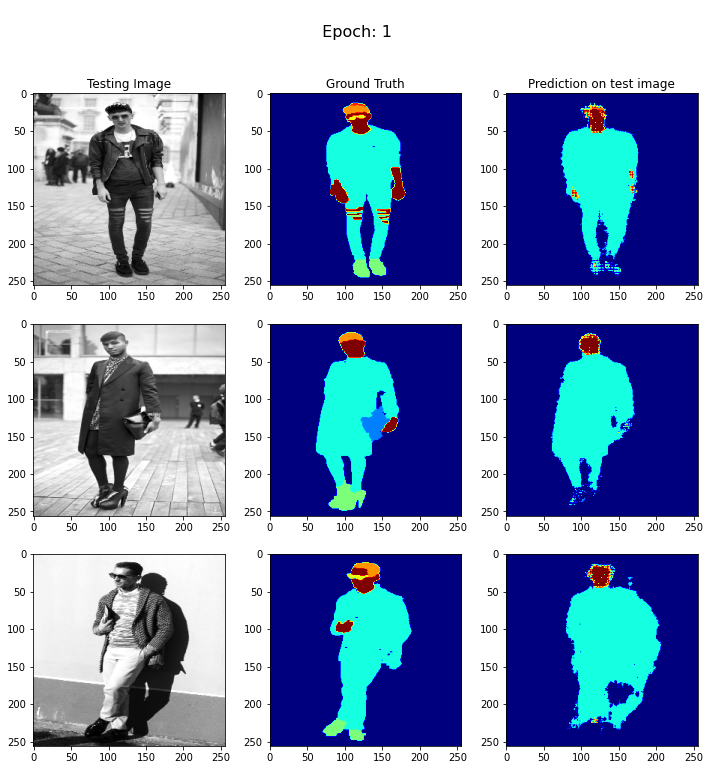


Sample Prediction after epoch 2

57/57 [==============================] - 8s 138ms/step - loss: 0.2349 - accuracy: 0.9301 - val_loss: 0.2435 - val_accuracy: 0.9245
Epoch 3/50
1/1 [==============================] - 0s 20ms/step


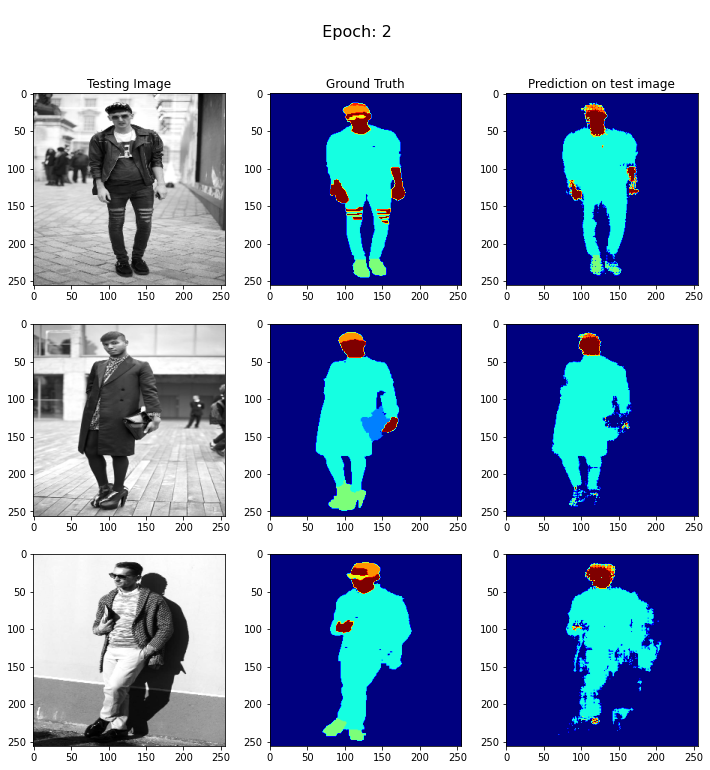


Sample Prediction after epoch 3

57/57 [==============================] - 8s 142ms/step - loss: 0.1774 - accuracy: 0.9460 - val_loss: 0.2186 - val_accuracy: 0.9273
Epoch 4/50
1/1 [==============================] - 0s 19ms/step


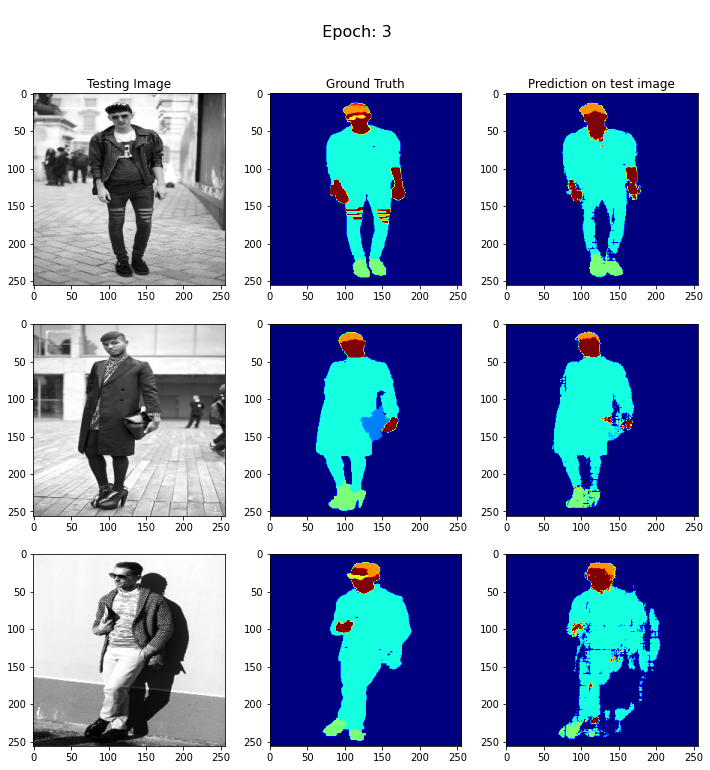


Sample Prediction after epoch 4

57/57 [==============================] - 8s 140ms/step - loss: 0.1475 - accuracy: 0.9531 - val_loss: 0.1738 - val_accuracy: 0.9427
Epoch 5/50
1/1 [==============================] - 0s 19ms/step


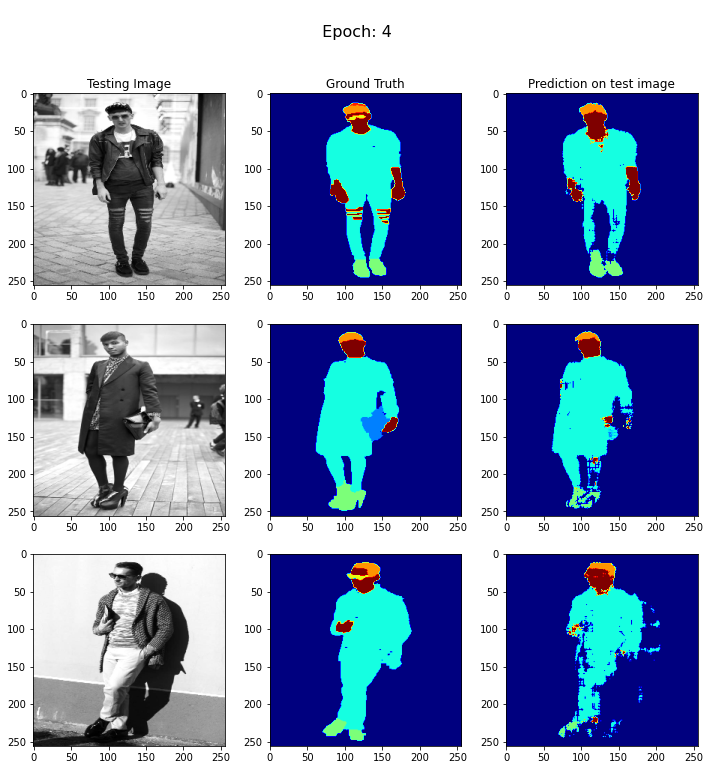


Sample Prediction after epoch 5

57/57 [==============================] - 8s 142ms/step - loss: 0.1315 - accuracy: 0.9568 - val_loss: 0.1841 - val_accuracy: 0.9370
Epoch 6/50
1/1 [==============================] - 0s 19ms/step


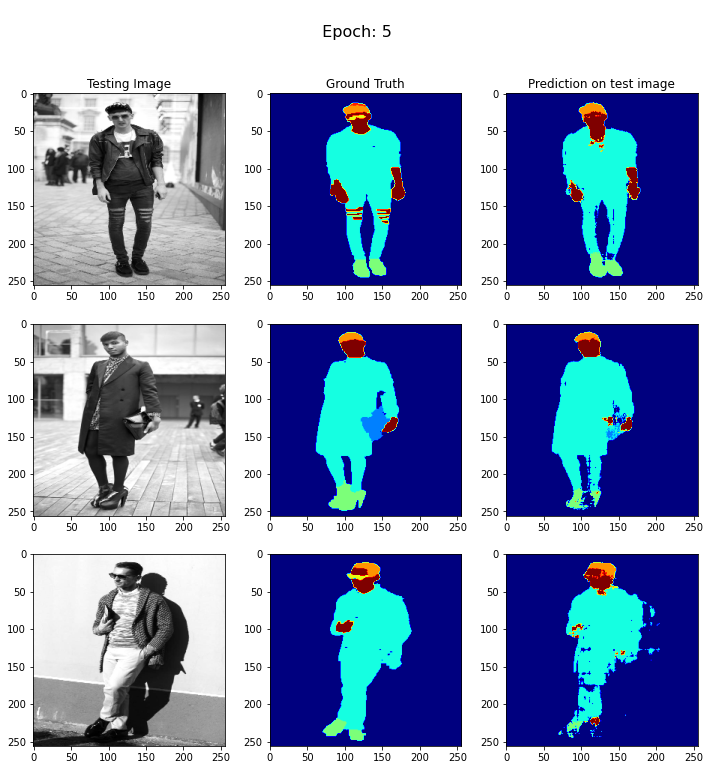


Sample Prediction after epoch 6

57/57 [==============================] - 8s 144ms/step - loss: 0.1215 - accuracy: 0.9593 - val_loss: 0.1548 - val_accuracy: 0.9475
Epoch 7/50
1/1 [==============================] - 0s 20ms/step


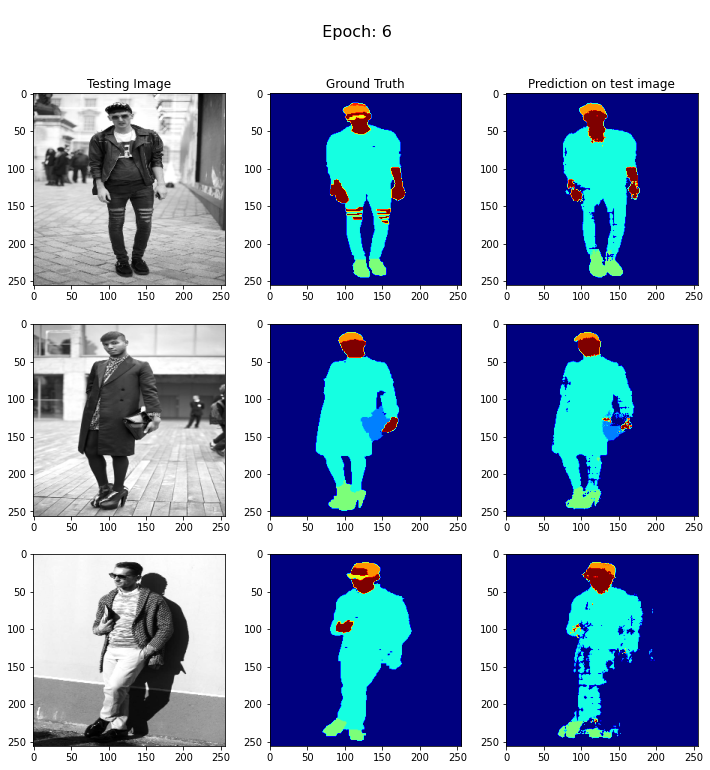


Sample Prediction after epoch 7

57/57 [==============================] - 8s 145ms/step - loss: 0.1141 - accuracy: 0.9612 - val_loss: 0.1537 - val_accuracy: 0.9474
Epoch 8/50
1/1 [==============================] - 0s 20ms/step


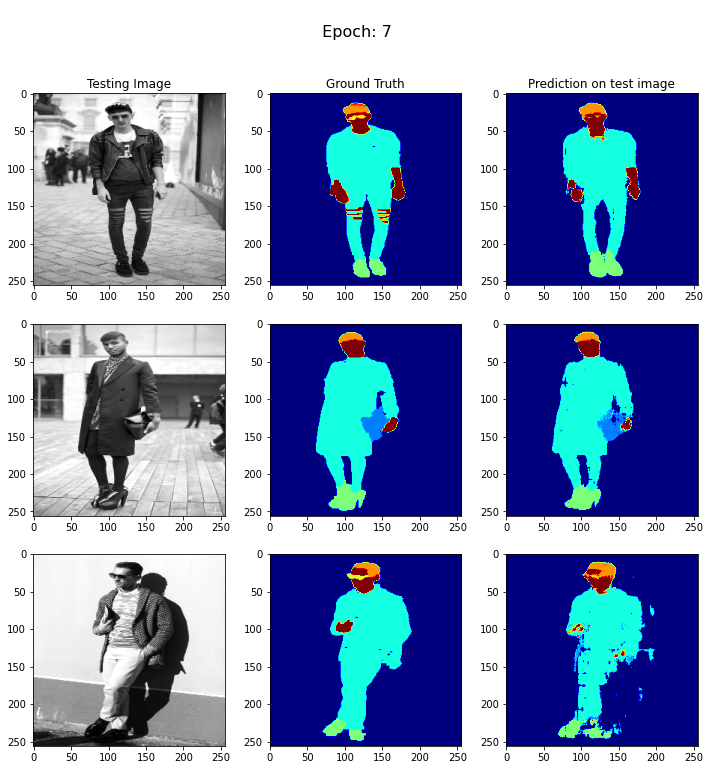


Sample Prediction after epoch 8

57/57 [==============================] - 8s 145ms/step - loss: 0.1054 - accuracy: 0.9638 - val_loss: 0.1521 - val_accuracy: 0.9482
Epoch 9/50
1/1 [==============================] - 0s 36ms/step


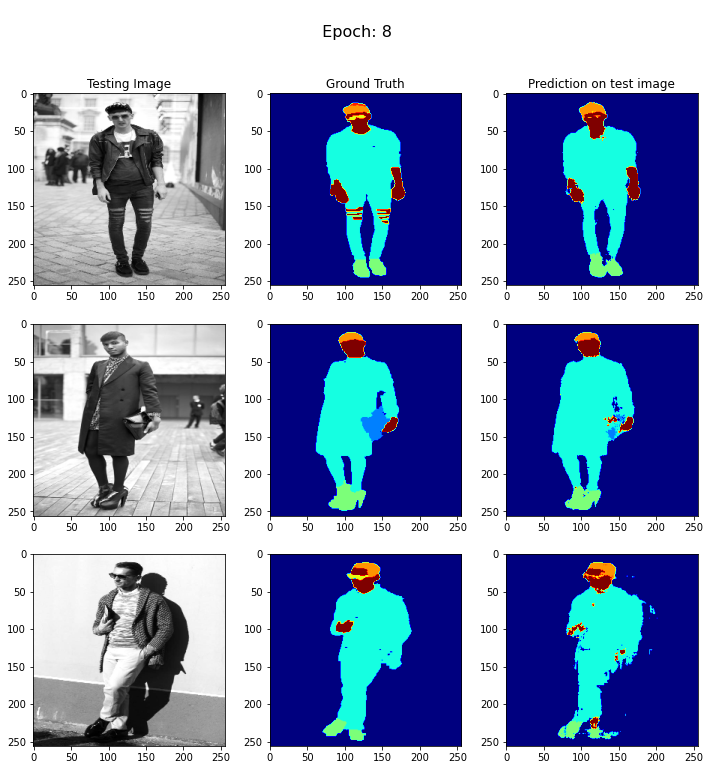


Sample Prediction after epoch 9

57/57 [==============================] - 9s 156ms/step - loss: 0.1002 - accuracy: 0.9654 - val_loss: 0.1318 - val_accuracy: 0.9546
Epoch 10/50
1/1 [==============================] - 0s 20ms/step


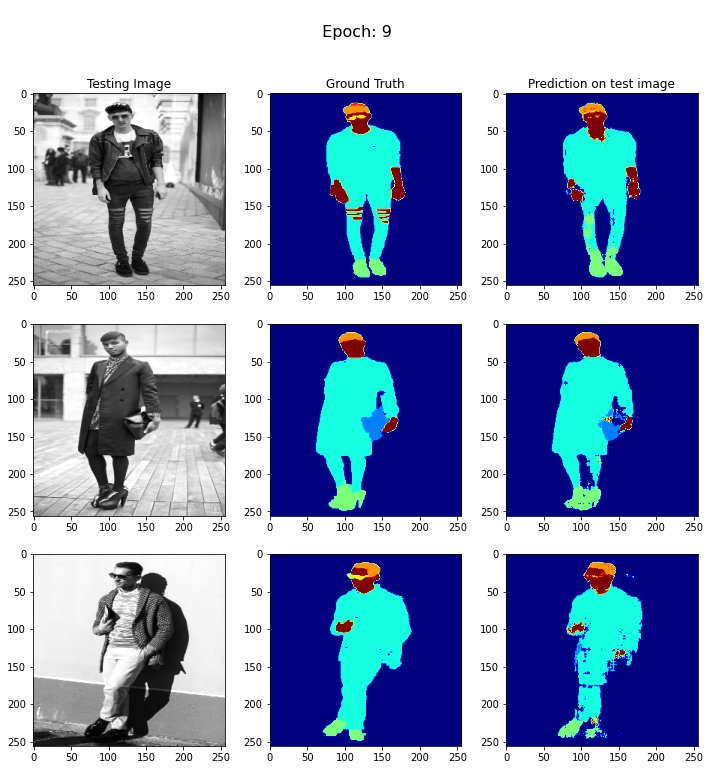


Sample Prediction after epoch 10

57/57 [==============================] - 8s 148ms/step - loss: 0.0946 - accuracy: 0.9672 - val_loss: 0.1545 - val_accuracy: 0.9467
Epoch 11/50
1/1 [==============================] - 0s 21ms/step


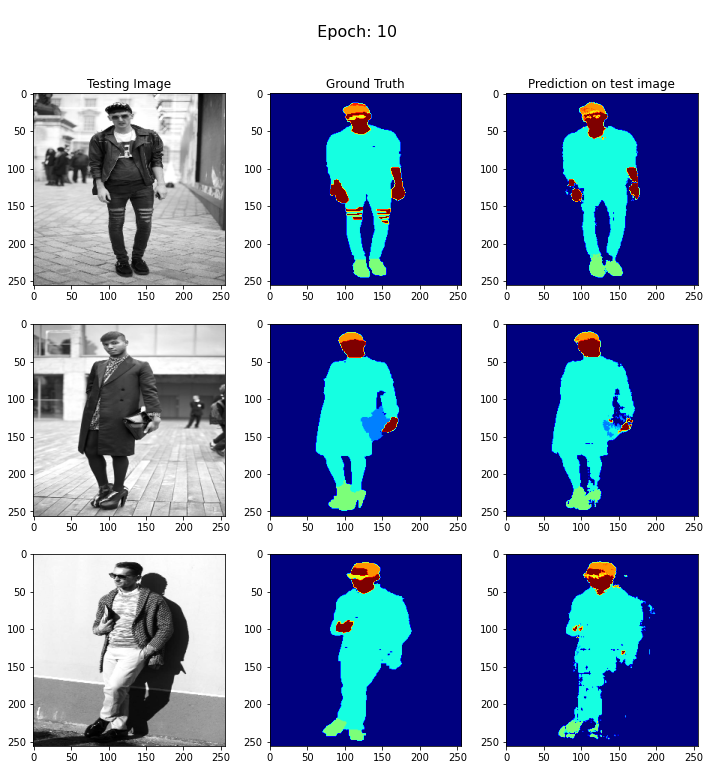


Sample Prediction after epoch 11

57/57 [==============================] - 9s 150ms/step - loss: 0.0888 - accuracy: 0.9691 - val_loss: 0.1473 - val_accuracy: 0.9512
Epoch 12/50
1/1 [==============================] - 0s 22ms/step


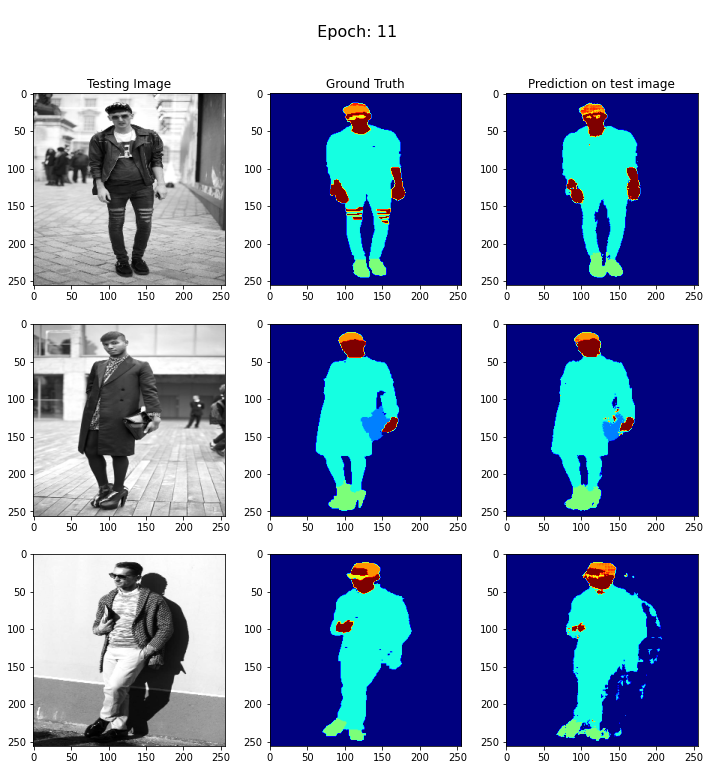


Sample Prediction after epoch 12

57/57 [==============================] - 8s 148ms/step - loss: 0.0834 - accuracy: 0.9708 - val_loss: 0.1341 - val_accuracy: 0.9553
Epoch 13/50
1/1 [==============================] - 0s 19ms/step


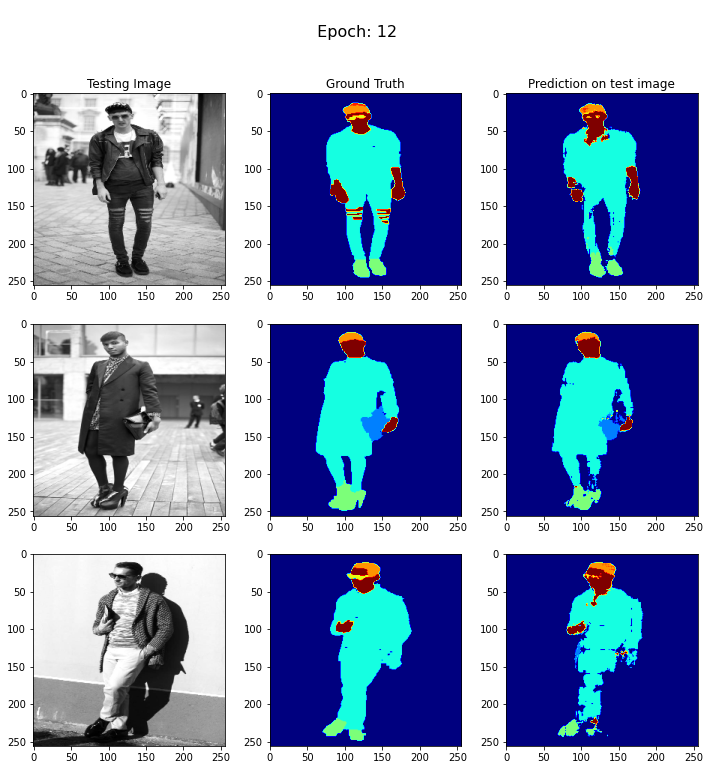


Sample Prediction after epoch 13

57/57 [==============================] - 8s 147ms/step - loss: 0.0792 - accuracy: 0.9722 - val_loss: 0.1802 - val_accuracy: 0.9399
Epoch 14/50
1/1 [==============================] - 0s 22ms/step


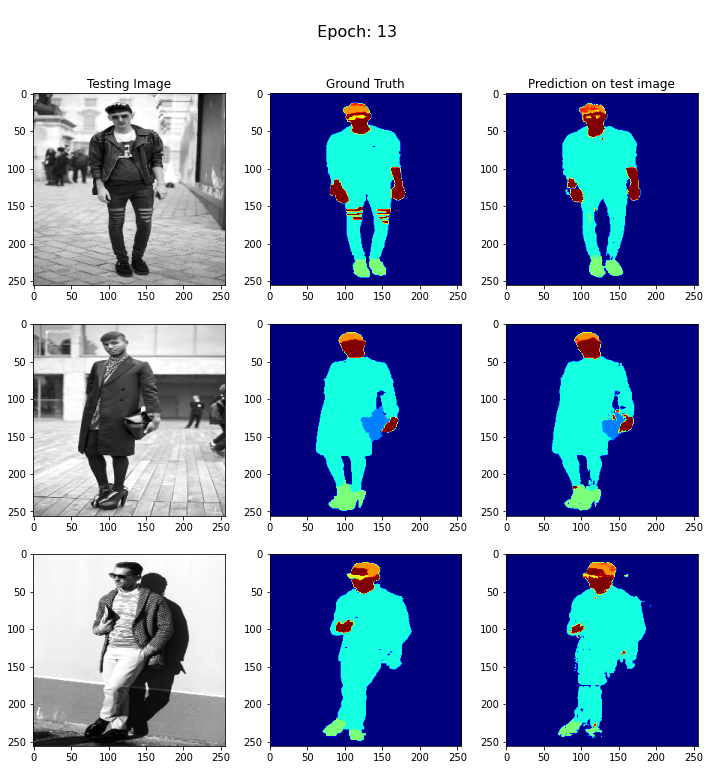


Sample Prediction after epoch 14

57/57 [==============================] - 8s 148ms/step - loss: 0.0743 - accuracy: 0.9740 - val_loss: 0.1367 - val_accuracy: 0.9554
Epoch 15/50
1/1 [==============================] - 0s 20ms/step


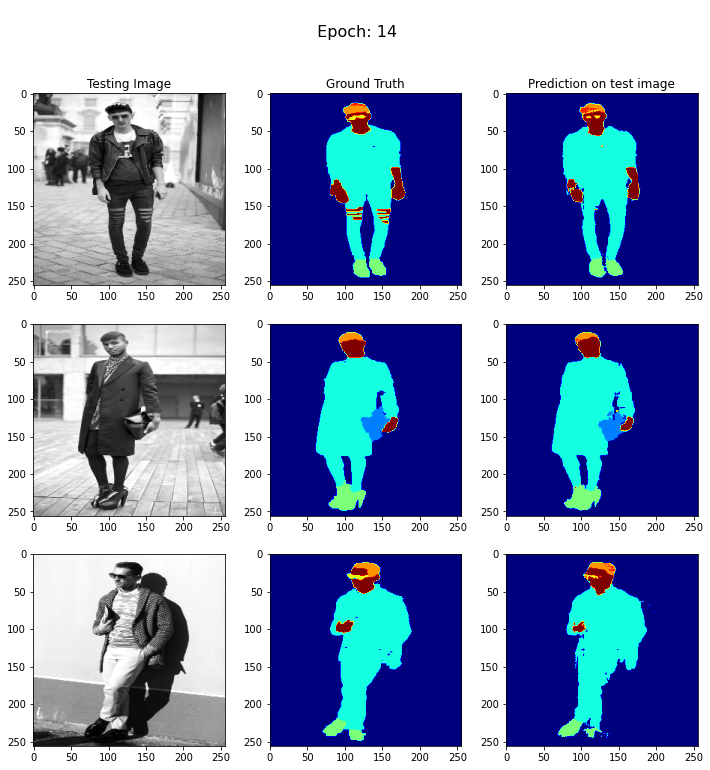


Sample Prediction after epoch 15

57/57 [==============================] - 9s 150ms/step - loss: 0.0678 - accuracy: 0.9762 - val_loss: 0.1442 - val_accuracy: 0.9537
Epoch 16/50
1/1 [==============================] - 0s 21ms/step


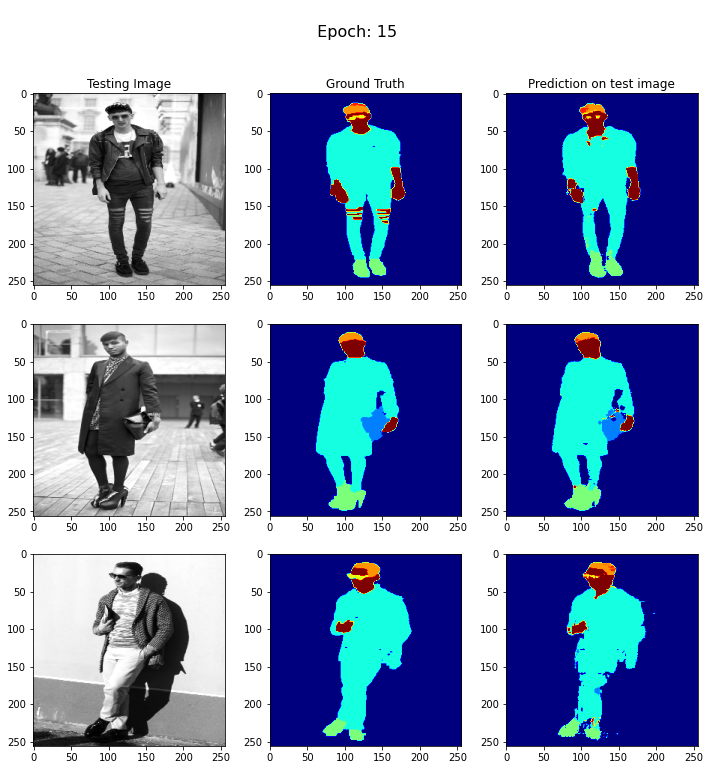


Sample Prediction after epoch 16

57/57 [==============================] - 8s 146ms/step - loss: 0.0624 - accuracy: 0.9781 - val_loss: 0.1488 - val_accuracy: 0.9519
Epoch 17/50
1/1 [==============================] - 0s 20ms/step


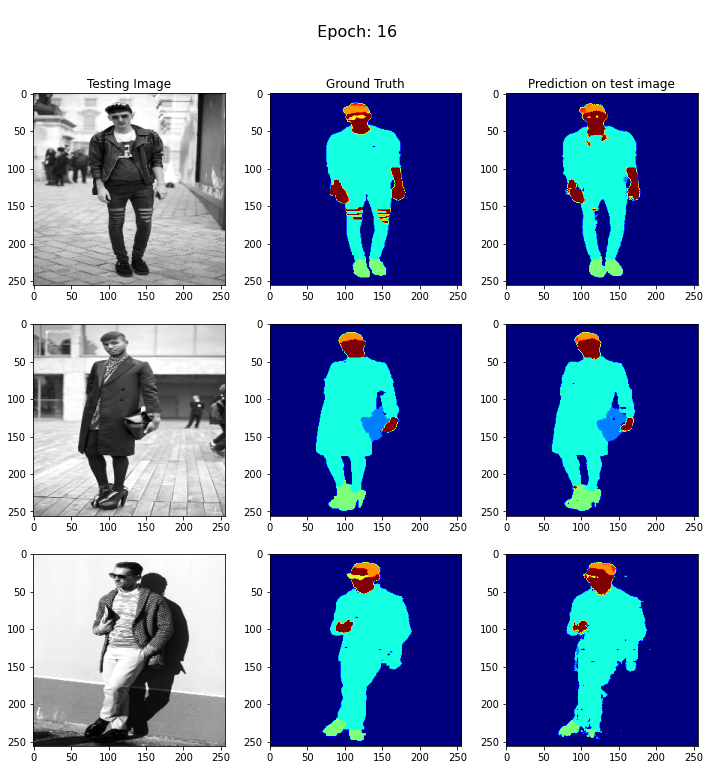


Sample Prediction after epoch 17

57/57 [==============================] - 8s 147ms/step - loss: 0.0573 - accuracy: 0.9798 - val_loss: 0.1504 - val_accuracy: 0.9525
Epoch 18/50
1/1 [==============================] - 0s 18ms/step


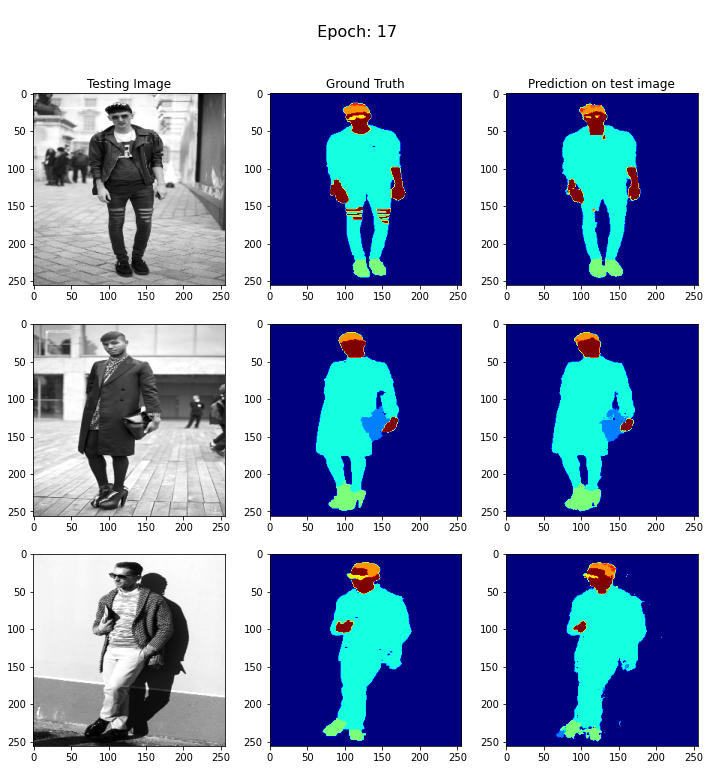


Sample Prediction after epoch 18

57/57 [==============================] - 8s 146ms/step - loss: 0.0530 - accuracy: 0.9812 - val_loss: 0.1572 - val_accuracy: 0.9538
Epoch 19/50
1/1 [==============================] - 0s 26ms/step


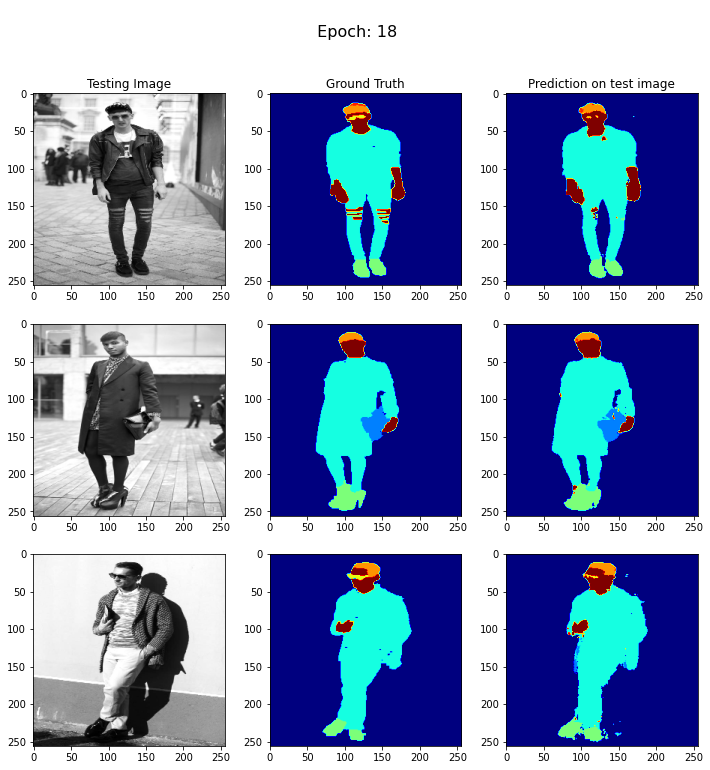


Sample Prediction after epoch 19

57/57 [==============================] - 9s 151ms/step - loss: 0.0495 - accuracy: 0.9823 - val_loss: 0.1539 - val_accuracy: 0.9540
Epoch 20/50
1/1 [==============================] - 0s 20ms/step


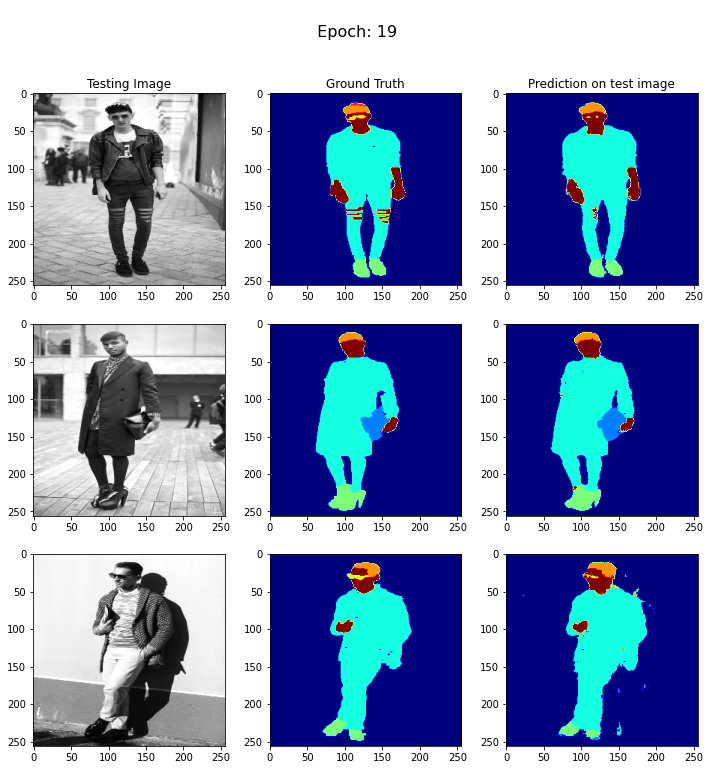


Sample Prediction after epoch 20

57/57 [==============================] - 9s 153ms/step - loss: 0.0460 - accuracy: 0.9835 - val_loss: 0.1573 - val_accuracy: 0.9547
Epoch 21/50
1/1 [==============================] - 0s 32ms/step


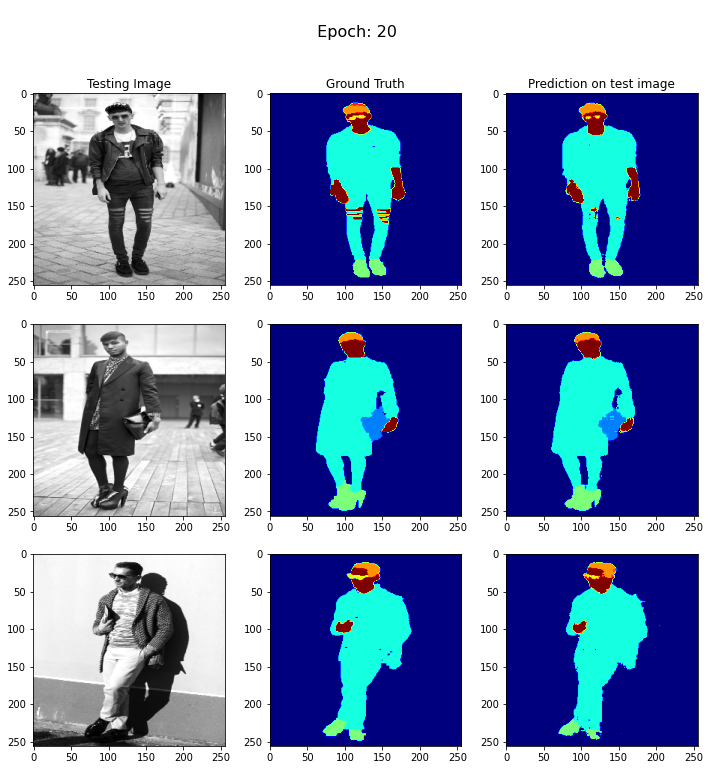


Sample Prediction after epoch 21

57/57 [==============================] - 8s 148ms/step - loss: 0.0440 - accuracy: 0.9841 - val_loss: 0.1690 - val_accuracy: 0.9550
Epoch 22/50
1/1 [==============================] - 0s 23ms/step


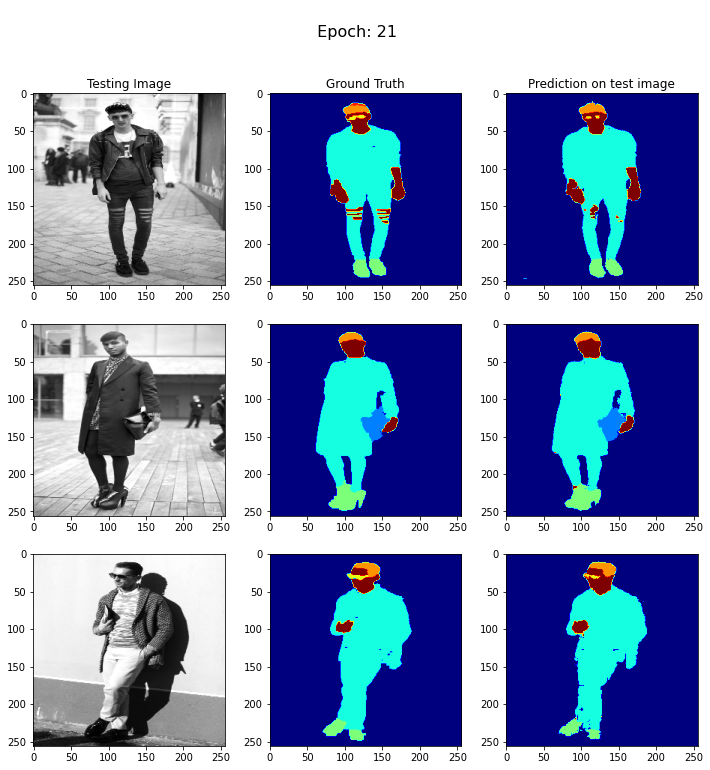


Sample Prediction after epoch 22

57/57 [==============================] - 9s 151ms/step - loss: 0.0396 - accuracy: 0.9856 - val_loss: 0.1616 - val_accuracy: 0.9550
Epoch 23/50
1/1 [==============================] - 0s 37ms/step


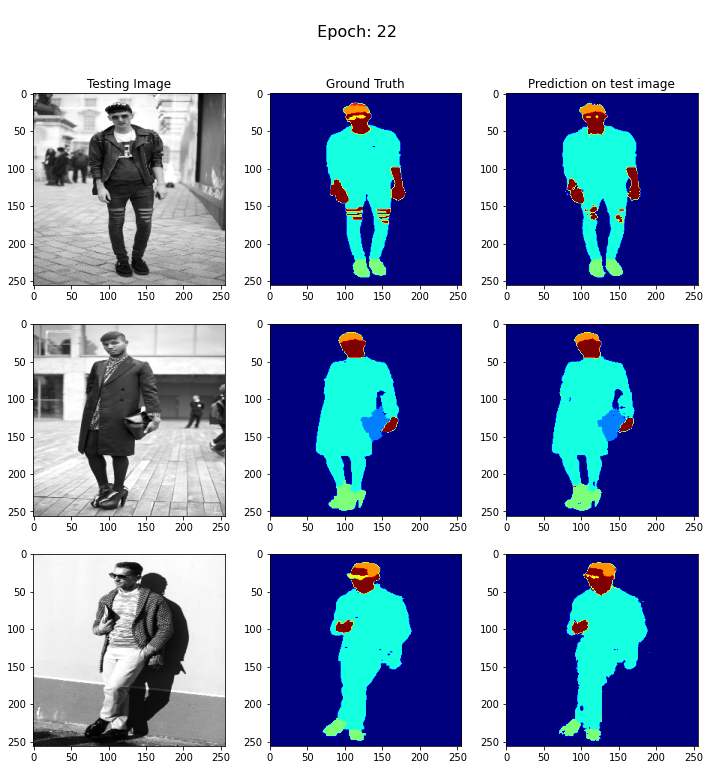


Sample Prediction after epoch 23

57/57 [==============================] - 9s 151ms/step - loss: 0.0371 - accuracy: 0.9865 - val_loss: 0.1738 - val_accuracy: 0.9540
Epoch 24/50
1/1 [==============================] - 0s 28ms/step


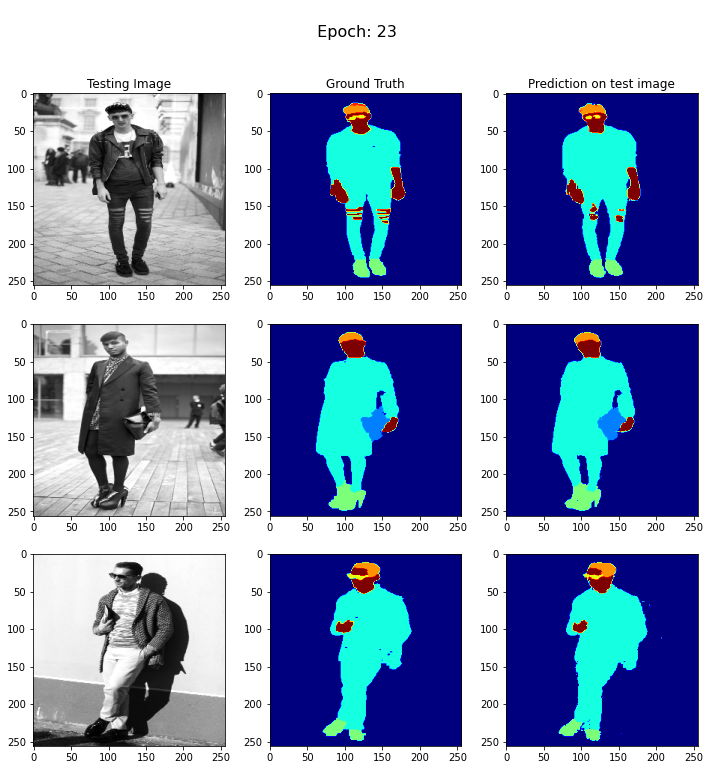


Sample Prediction after epoch 24

57/57 [==============================] - 9s 152ms/step - loss: 0.0351 - accuracy: 0.9871 - val_loss: 0.1690 - val_accuracy: 0.9563
Epoch 25/50
1/1 [==============================] - 0s 31ms/step


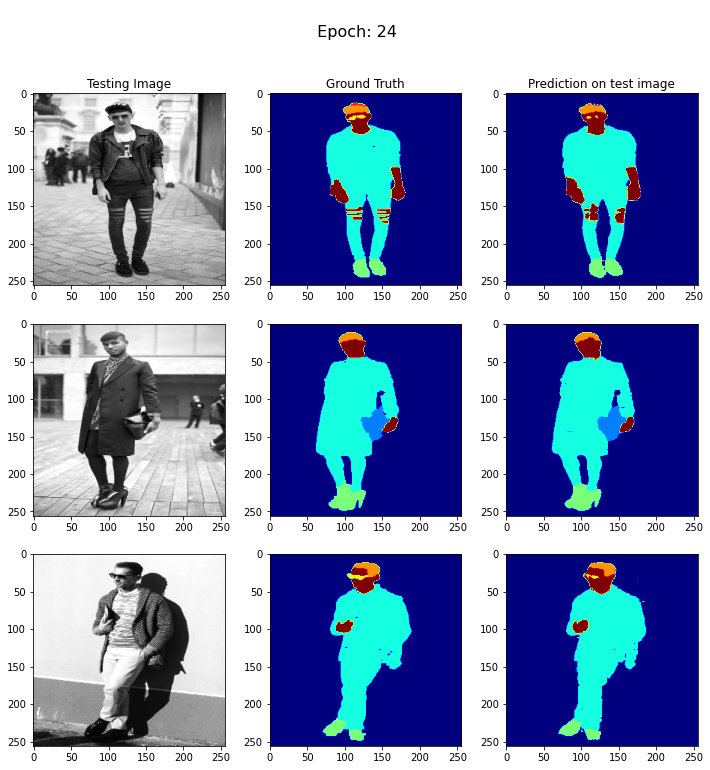


Sample Prediction after epoch 25

57/57 [==============================] - 8s 149ms/step - loss: 0.0326 - accuracy: 0.9880 - val_loss: 0.1675 - val_accuracy: 0.9559
Epoch 26/50
1/1 [==============================] - 0s 29ms/step


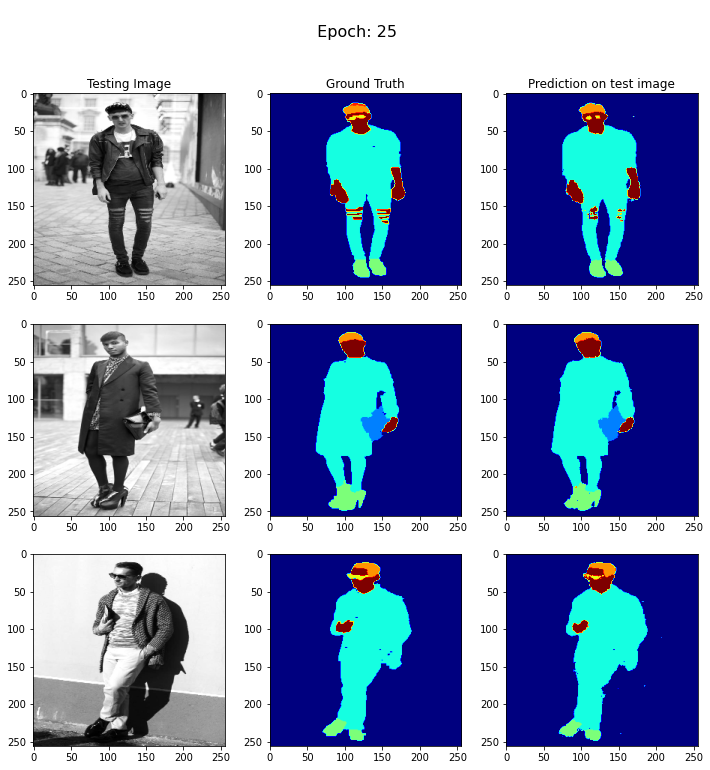


Sample Prediction after epoch 26

57/57 [==============================] - 9s 154ms/step - loss: 0.0311 - accuracy: 0.9885 - val_loss: 0.1790 - val_accuracy: 0.9552
Epoch 27/50
1/1 [==============================] - 0s 27ms/step


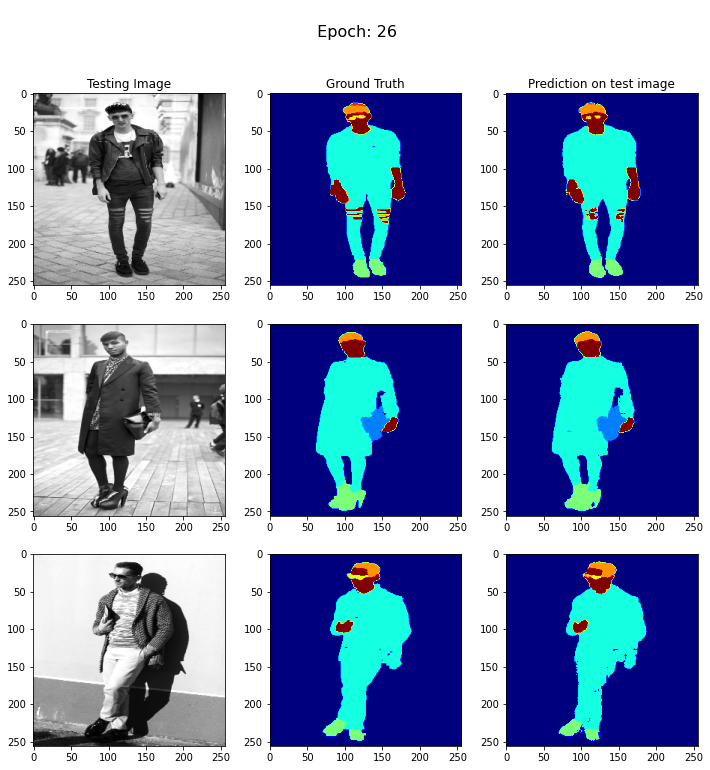


Sample Prediction after epoch 27

57/57 [==============================] - 8s 148ms/step - loss: 0.0299 - accuracy: 0.9889 - val_loss: 0.1778 - val_accuracy: 0.9550
Epoch 28/50
1/1 [==============================] - 0s 43ms/step


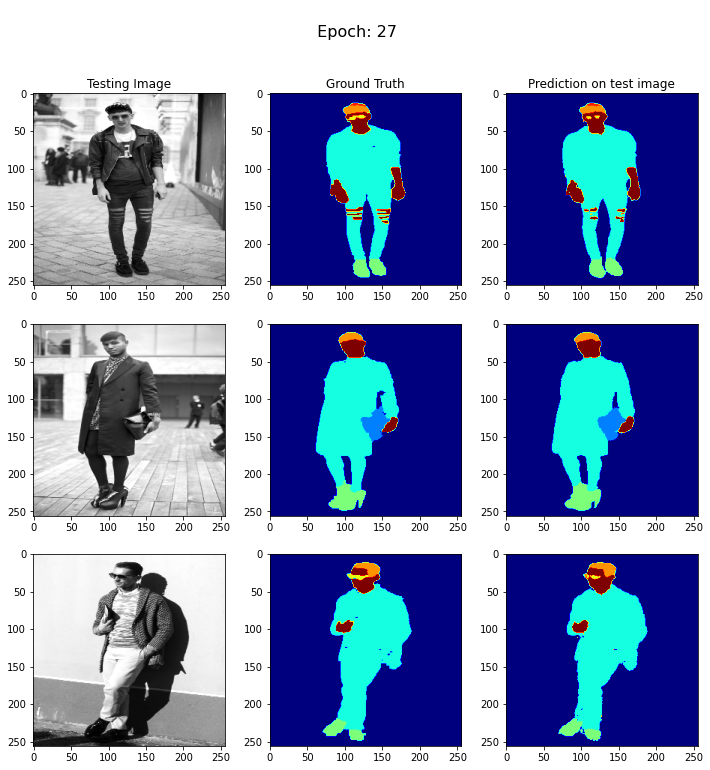


Sample Prediction after epoch 28

57/57 [==============================] - 9s 156ms/step - loss: 0.0286 - accuracy: 0.9894 - val_loss: 0.1804 - val_accuracy: 0.9560
Epoch 29/50
1/1 [==============================] - 0s 27ms/step


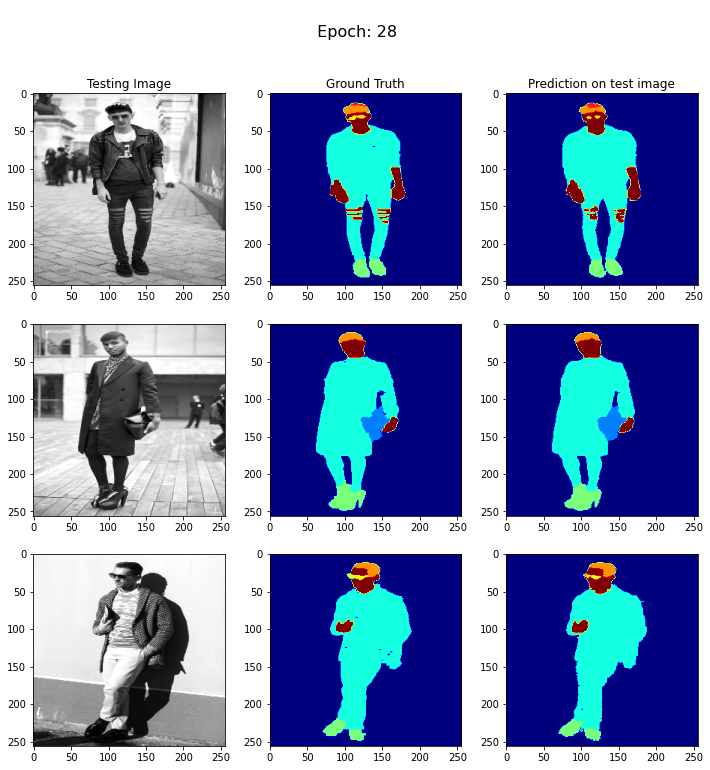


Sample Prediction after epoch 29

57/57 [==============================] - 8s 149ms/step - loss: 0.0273 - accuracy: 0.9898 - val_loss: 0.1778 - val_accuracy: 0.9565
Epoch 30/50
1/1 [==============================] - 0s 39ms/step


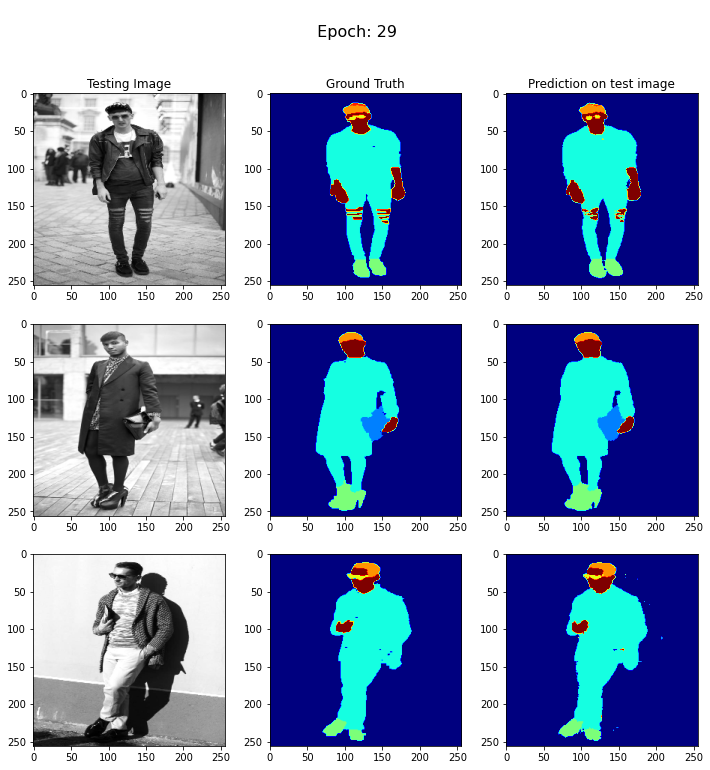


Sample Prediction after epoch 30

57/57 [==============================] - 8s 149ms/step - loss: 0.0265 - accuracy: 0.9900 - val_loss: 0.1825 - val_accuracy: 0.9556
Epoch 31/50
1/1 [==============================] - 0s 28ms/step


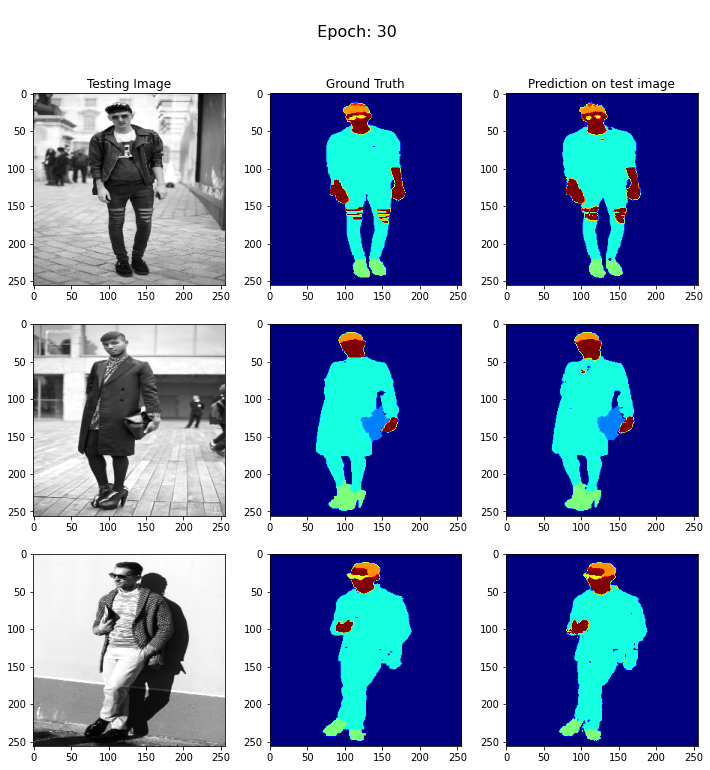


Sample Prediction after epoch 31

57/57 [==============================] - 9s 153ms/step - loss: 0.0253 - accuracy: 0.9905 - val_loss: 0.1975 - val_accuracy: 0.9527
Epoch 32/50
1/1 [==============================] - 0s 35ms/step


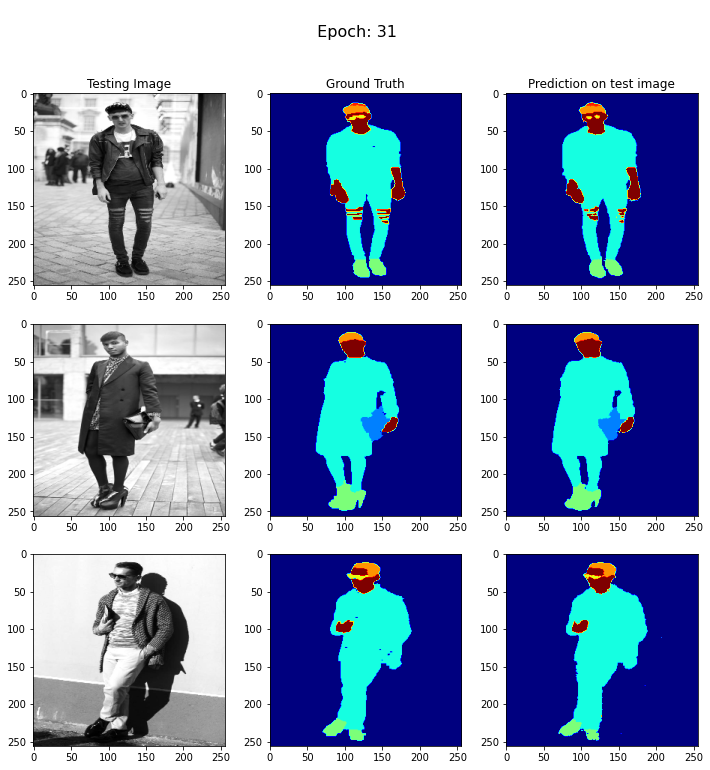


Sample Prediction after epoch 32

57/57 [==============================] - 9s 153ms/step - loss: 0.0246 - accuracy: 0.9907 - val_loss: 0.1923 - val_accuracy: 0.9561
Epoch 33/50
1/1 [==============================] - 0s 44ms/step


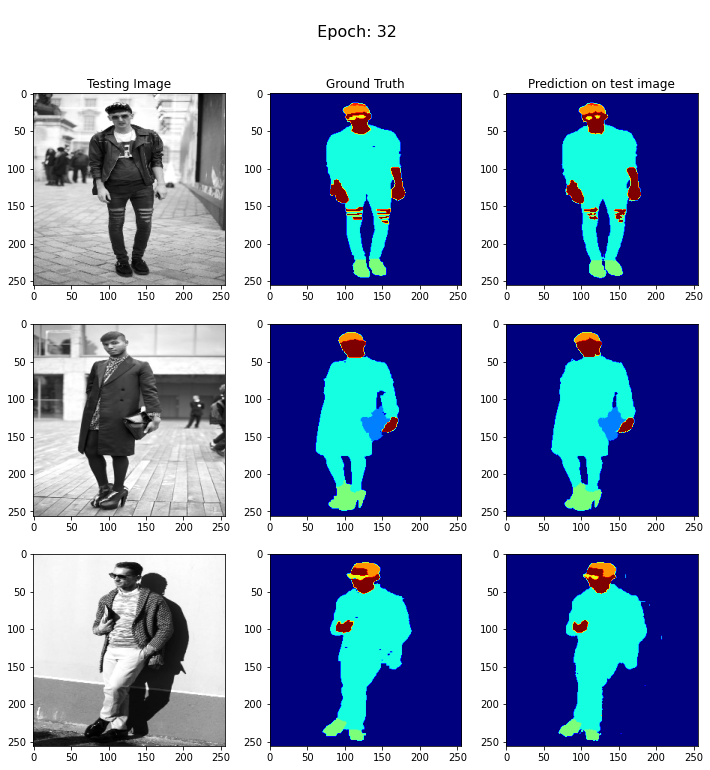


Sample Prediction after epoch 33

57/57 [==============================] - 8s 149ms/step - loss: 0.0231 - accuracy: 0.9912 - val_loss: 0.2073 - val_accuracy: 0.9551
Epoch 34/50
1/1 [==============================] - 0s 28ms/step


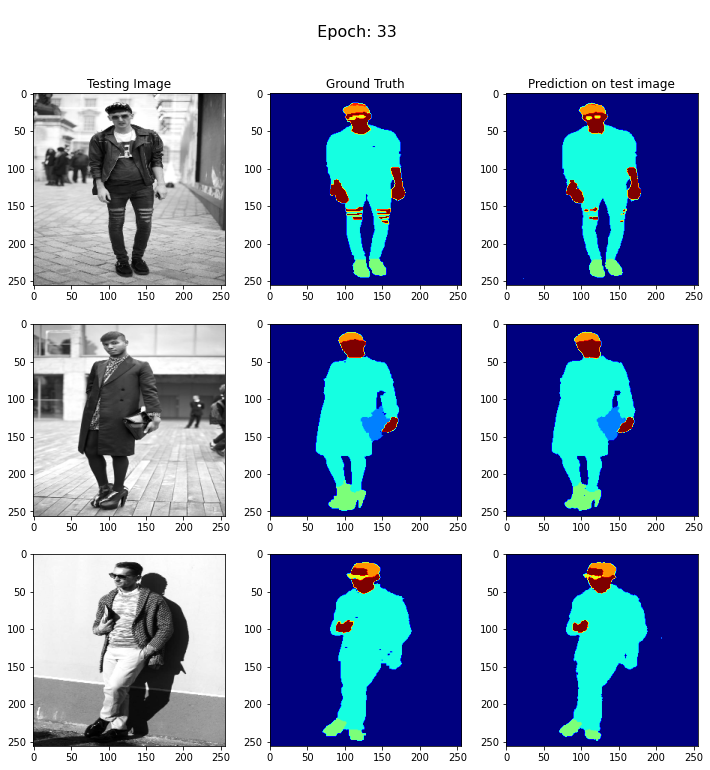


Sample Prediction after epoch 34

57/57 [==============================] - 8s 149ms/step - loss: 0.0221 - accuracy: 0.9916 - val_loss: 0.2094 - val_accuracy: 0.9557
Epoch 35/50
1/1 [==============================] - 0s 31ms/step


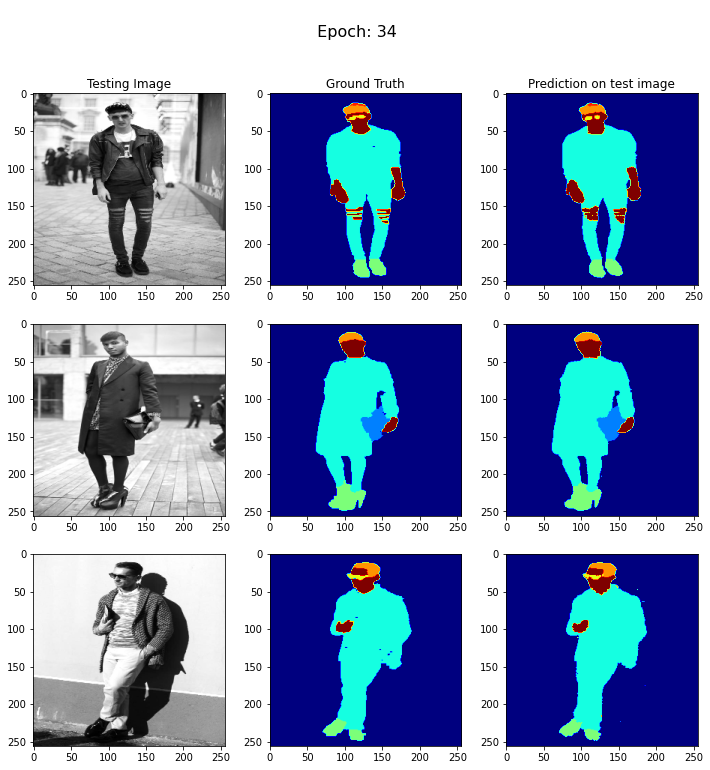


Sample Prediction after epoch 35

57/57 [==============================] - 8s 150ms/step - loss: 0.0210 - accuracy: 0.9920 - val_loss: 0.2026 - val_accuracy: 0.9557
Epoch 36/50
1/1 [==============================] - 0s 28ms/step


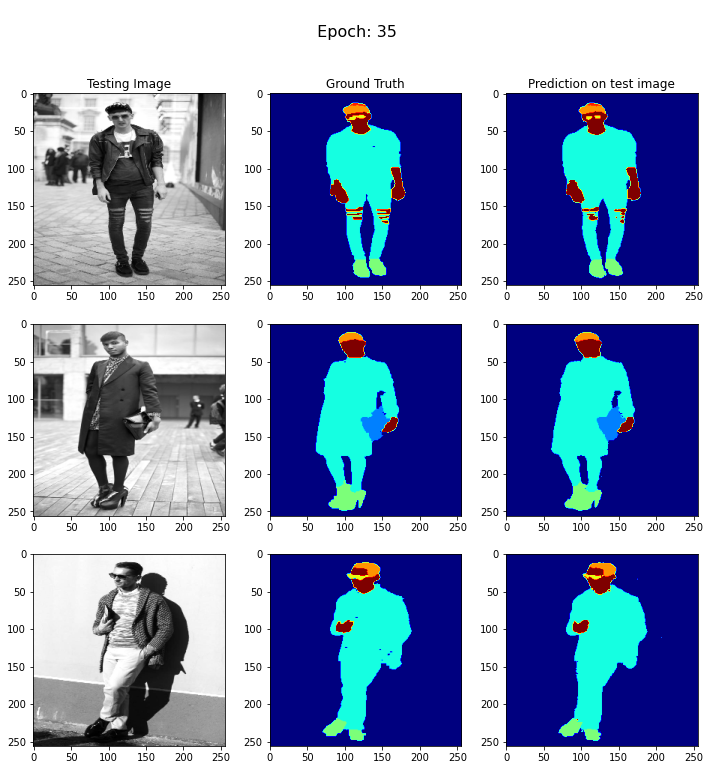


Sample Prediction after epoch 36

57/57 [==============================] - 8s 148ms/step - loss: 0.0205 - accuracy: 0.9922 - val_loss: 0.1948 - val_accuracy: 0.9555
Epoch 37/50
1/1 [==============================] - 0s 40ms/step


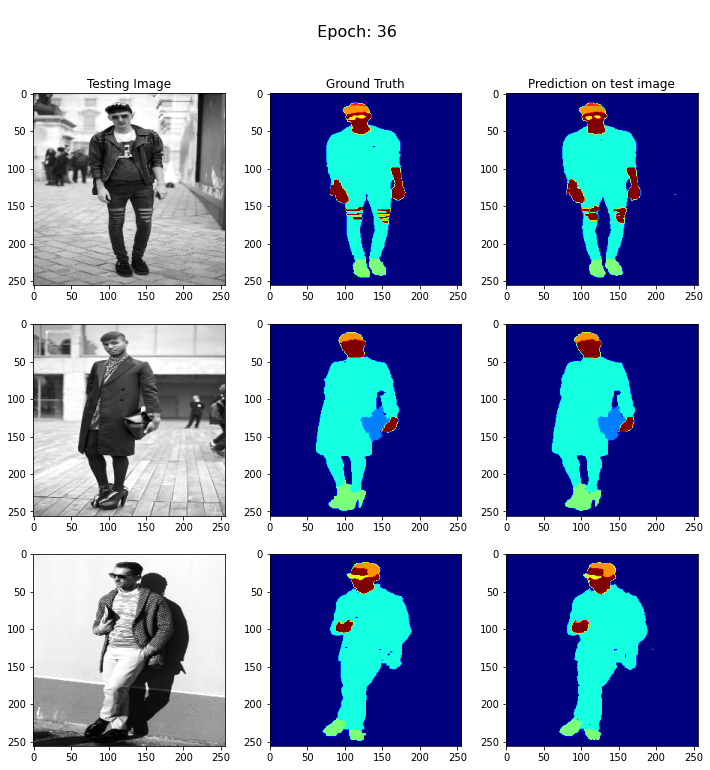


Sample Prediction after epoch 37

57/57 [==============================] - 9s 153ms/step - loss: 0.0199 - accuracy: 0.9924 - val_loss: 0.2027 - val_accuracy: 0.9554
Epoch 38/50
1/1 [==============================] - 0s 30ms/step


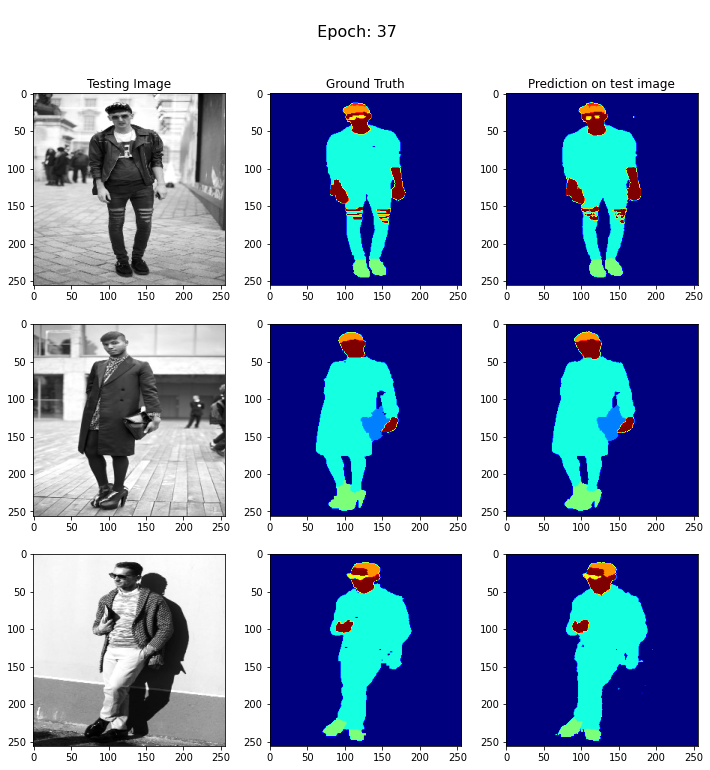


Sample Prediction after epoch 38

57/57 [==============================] - 8s 149ms/step - loss: 0.0203 - accuracy: 0.9922 - val_loss: 0.2008 - val_accuracy: 0.9554
Epoch 39/50
1/1 [==============================] - 0s 29ms/step


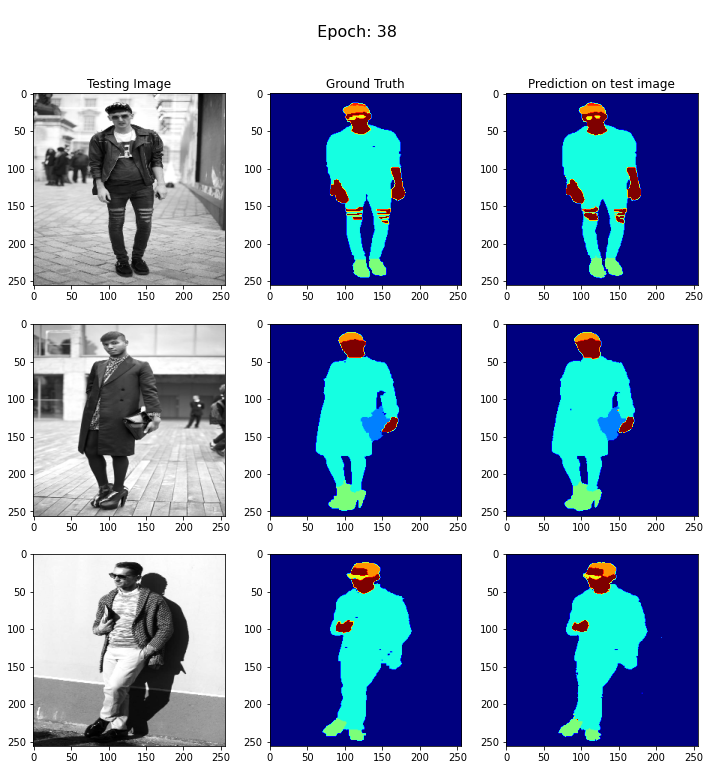


Sample Prediction after epoch 39

57/57 [==============================] - 8s 149ms/step - loss: 0.0188 - accuracy: 0.9928 - val_loss: 0.2030 - val_accuracy: 0.9562
Epoch 40/50
1/1 [==============================] - 0s 28ms/step


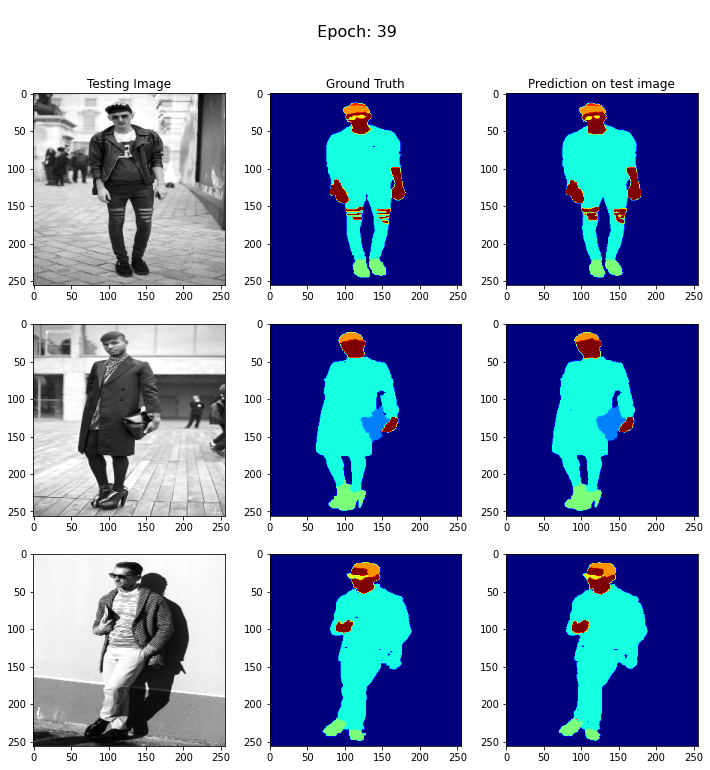


Sample Prediction after epoch 40

57/57 [==============================] - 8s 149ms/step - loss: 0.0177 - accuracy: 0.9932 - val_loss: 0.2079 - val_accuracy: 0.9552
Epoch 41/50
1/1 [==============================] - 0s 27ms/step


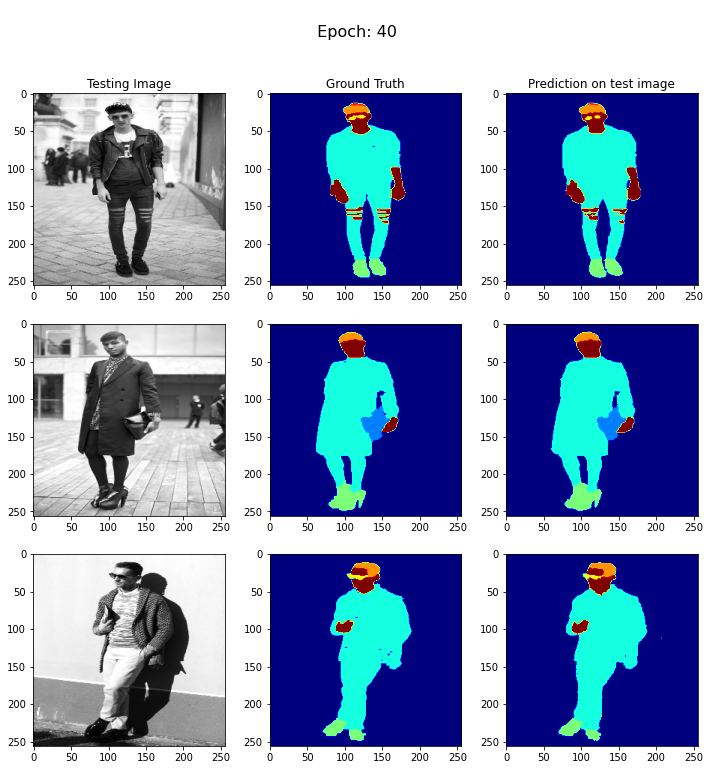


Sample Prediction after epoch 41

57/57 [==============================] - 8s 148ms/step - loss: 0.0179 - accuracy: 0.9931 - val_loss: 0.2099 - val_accuracy: 0.9564
Epoch 42/50
1/1 [==============================] - 0s 30ms/step


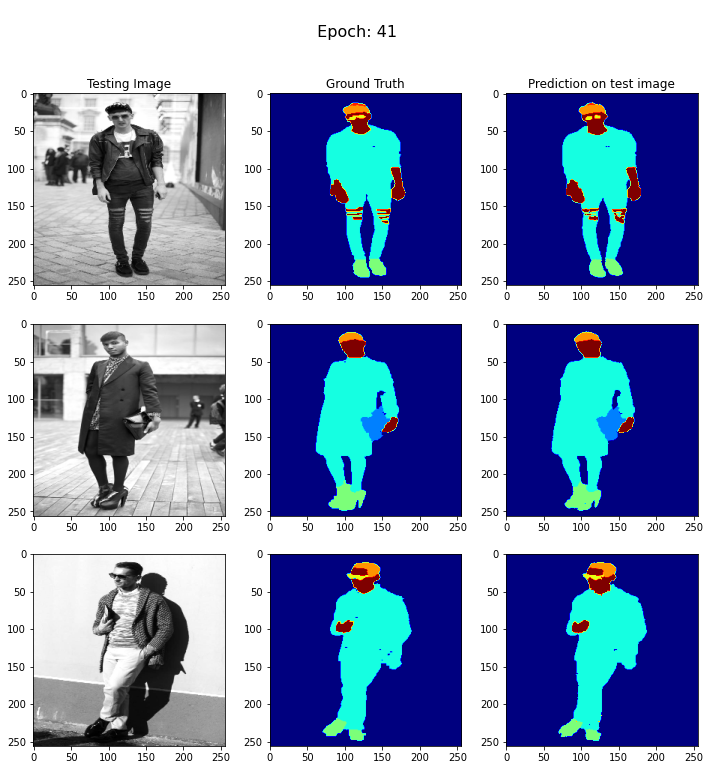


Sample Prediction after epoch 42

57/57 [==============================] - 9s 150ms/step - loss: 0.0173 - accuracy: 0.9933 - val_loss: 0.2129 - val_accuracy: 0.9551
Epoch 43/50
1/1 [==============================] - 0s 28ms/step


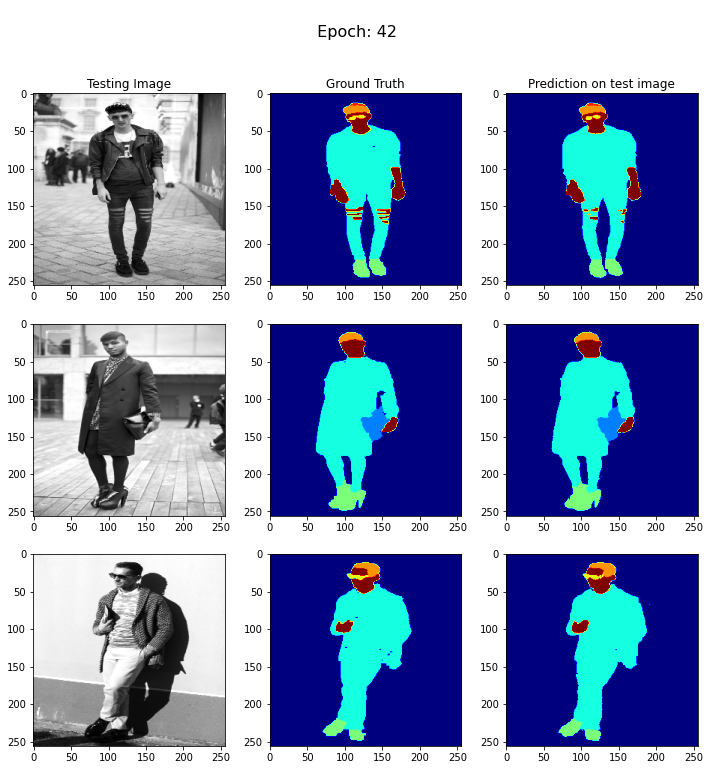


Sample Prediction after epoch 43

57/57 [==============================] - 9s 154ms/step - loss: 0.0169 - accuracy: 0.9935 - val_loss: 0.2114 - val_accuracy: 0.9561
Epoch 44/50
1/1 [==============================] - 0s 29ms/step


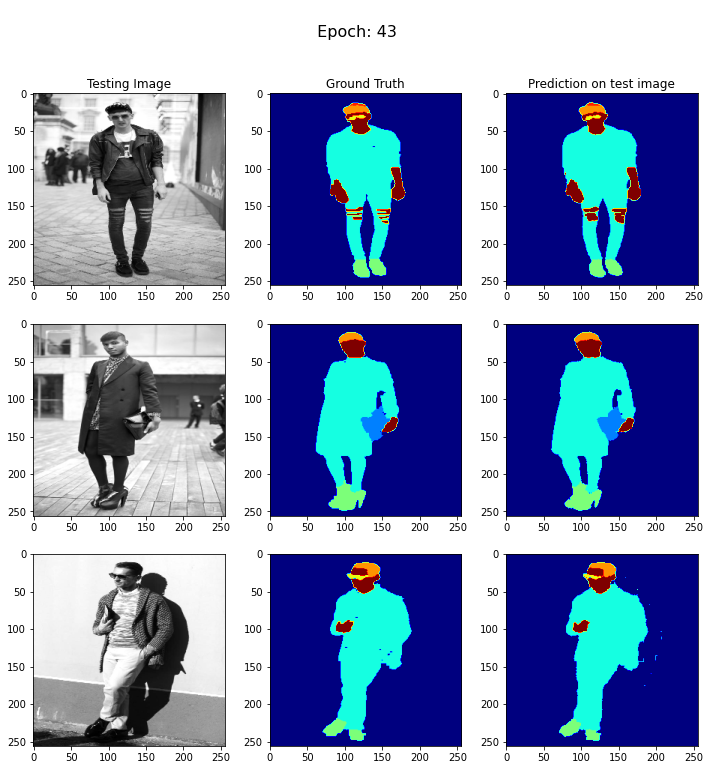


Sample Prediction after epoch 44

57/57 [==============================] - 9s 150ms/step - loss: 0.0167 - accuracy: 0.9936 - val_loss: 0.2291 - val_accuracy: 0.9556
Epoch 45/50
1/1 [==============================] - 0s 30ms/step


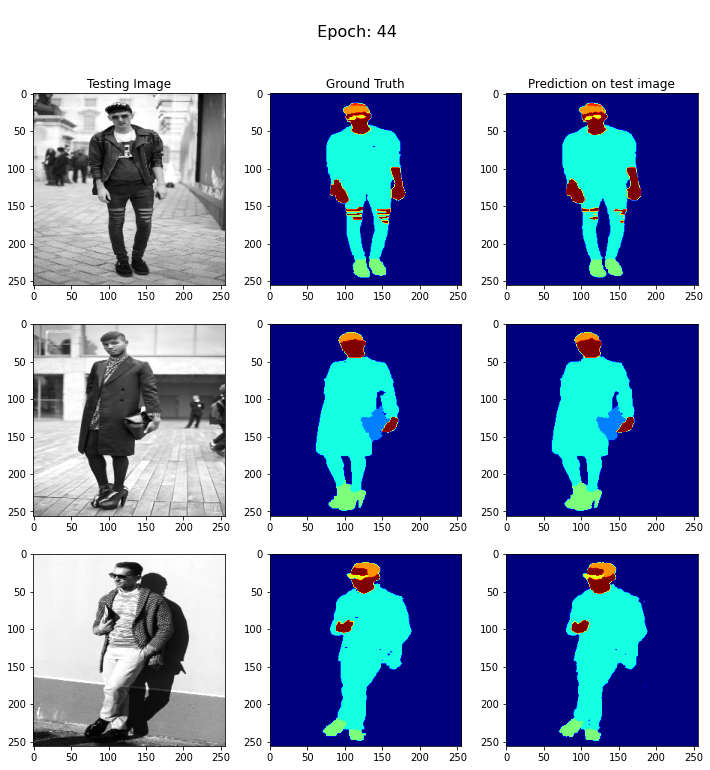


Sample Prediction after epoch 45

57/57 [==============================] - 9s 150ms/step - loss: 0.0174 - accuracy: 0.9933 - val_loss: 0.2168 - val_accuracy: 0.9561
Epoch 46/50
1/1 [==============================] - 0s 33ms/step


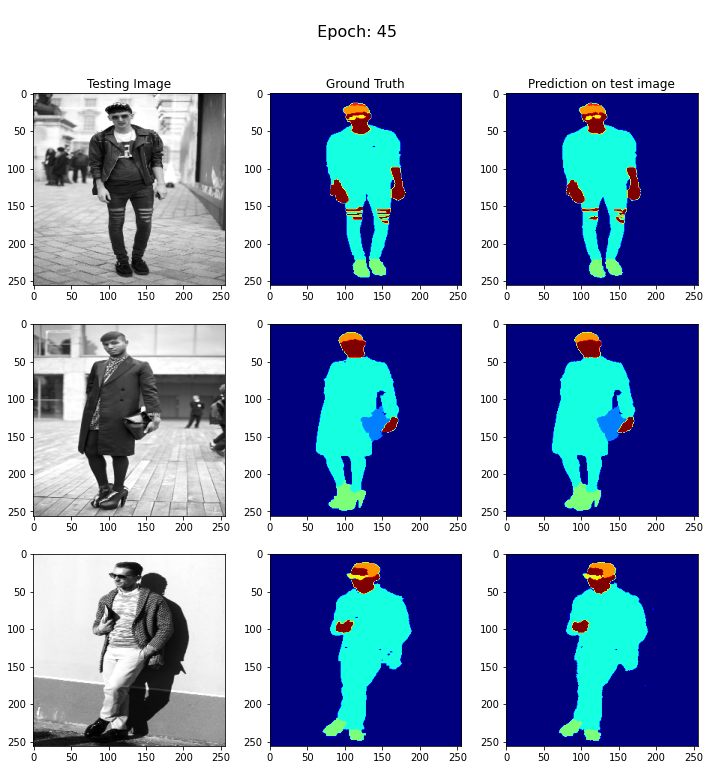


Sample Prediction after epoch 46

57/57 [==============================] - 9s 156ms/step - loss: 0.0160 - accuracy: 0.9938 - val_loss: 0.2162 - val_accuracy: 0.9559
Epoch 47/50
1/1 [==============================] - 0s 38ms/step


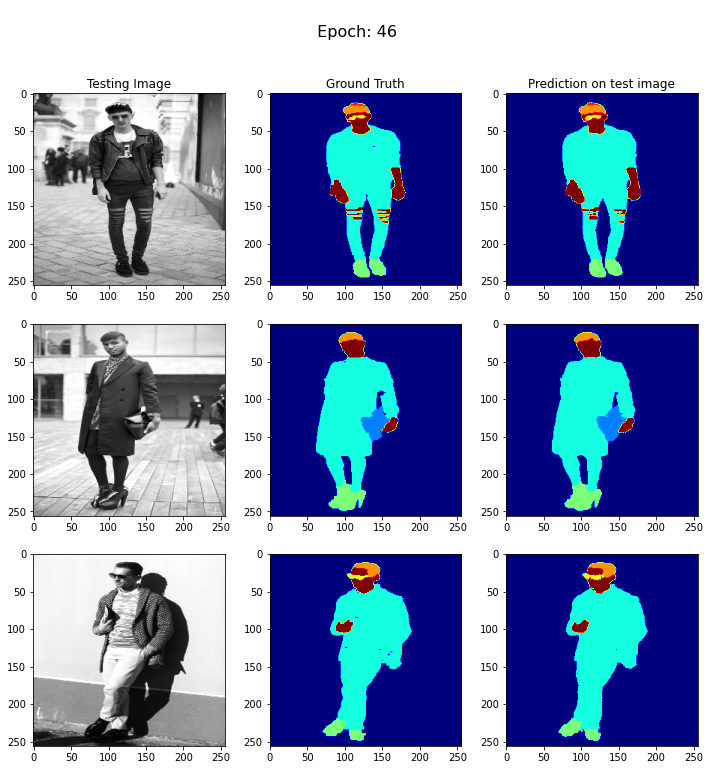


Sample Prediction after epoch 47

57/57 [==============================] - 9s 153ms/step - loss: 0.0158 - accuracy: 0.9938 - val_loss: 0.2168 - val_accuracy: 0.9557
Epoch 48/50
1/1 [==============================] - 0s 27ms/step


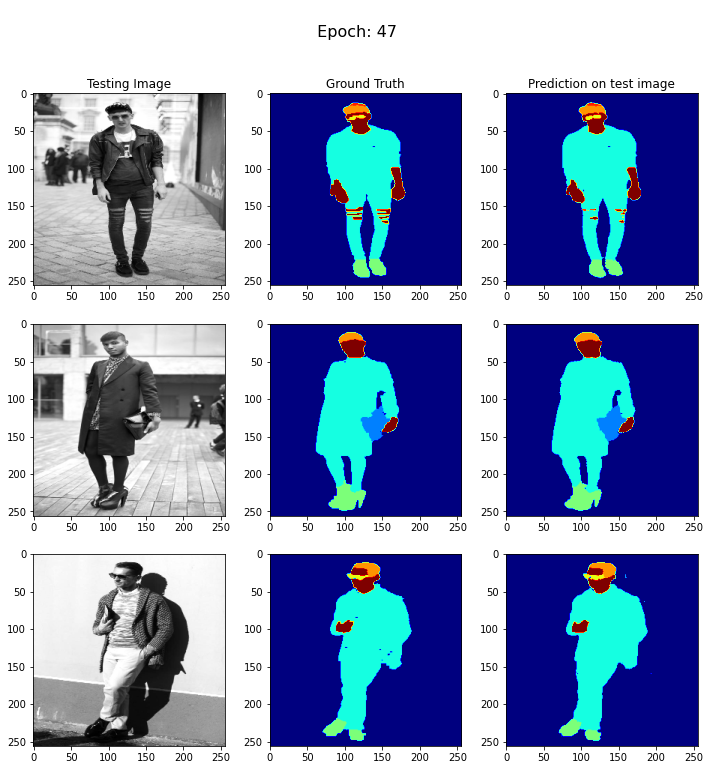


Sample Prediction after epoch 48

57/57 [==============================] - 9s 156ms/step - loss: 0.0152 - accuracy: 0.9941 - val_loss: 0.2287 - val_accuracy: 0.9554
Epoch 49/50
1/1 [==============================] - 0s 29ms/step


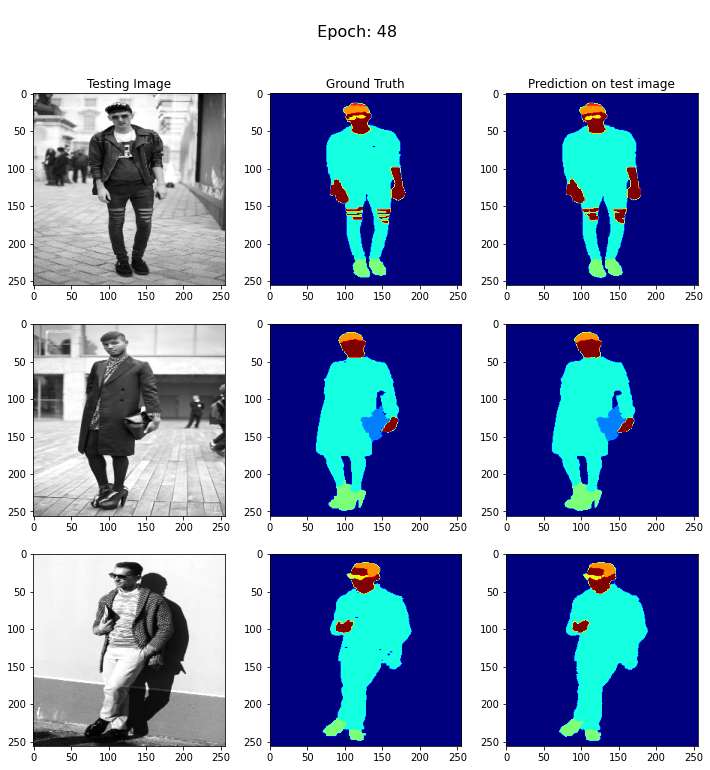


Sample Prediction after epoch 49

57/57 [==============================] - 9s 159ms/step - loss: 0.0154 - accuracy: 0.9940 - val_loss: 0.2213 - val_accuracy: 0.9563
Epoch 50/50
1/1 [==============================] - 0s 32ms/step


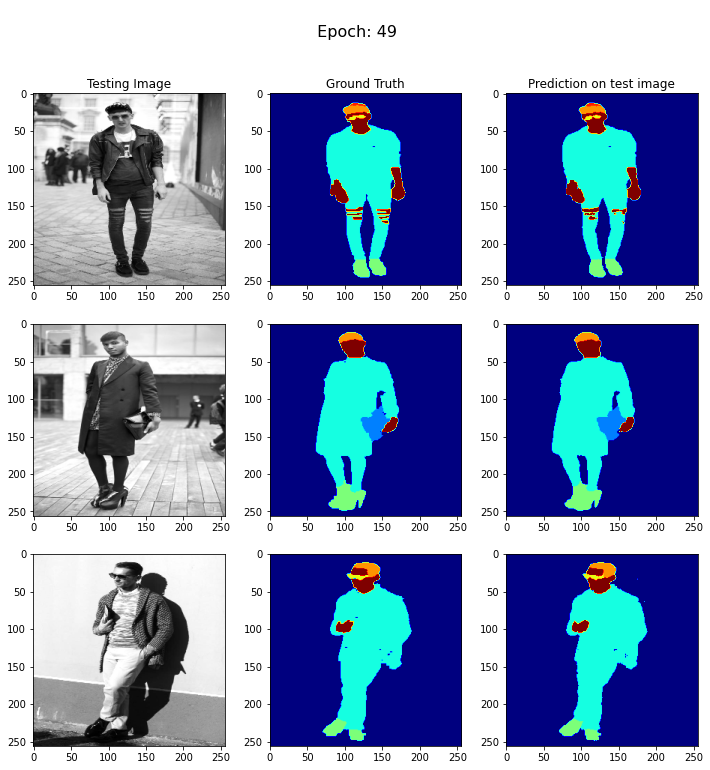


Sample Prediction after epoch 50

57/57 [==============================] - 9s 152ms/step - loss: 0.0146 - accuracy: 0.9943 - val_loss: 0.2253 - val_accuracy: 0.9556


In [ ]:
EPOCHS = 50
VAL_SUBSPLITS = 5
BATCH_SIZE = 16
VALIDATION_STEPS = len(X_val)//BATCH_SIZE//VAL_SUBSPLITS
STEPS_PER_EPOCH = len(X_train)//BATCH_SIZE
# sample_image = train_images[0]
# sample_mask = train_masks[0]

class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        show_predictions(epoch)
        print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

model_history = model.fit(X_train, y_train, epochs=EPOCHS,
                           batch_size = BATCH_SIZE,
                          verbose=1,
                          #steps_per_epoch=STEPS_PER_EPOCH,
                          #validation_steps=VALIDATION_STEPS,
                          validation_data=(X_val, y_val),
                          callbacks=[DisplayCallback()]
                          )

In [ ]:
model.save('./models/clothes_50')

In [ ]:
model = load_model('./models/clothes_50')

# Visualize Results

In [ ]:
test_path = "./data/test_images"

test_paths = []

for imgname in os.listdir(test_path):
  test_paths.append(os.path.join(test_path,imgname))

NameError: ignored

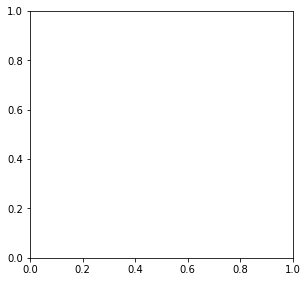

In [ ]:
test_path = "./data/test_images"
timgnum = 0
img_num = int(test_paths[timgnum].split("/")[-1].split(".")[0].split("_")[-1])

plt.figure(figsize=(16,10))

plt.subplot(2,3,1)
img = cv2.imread(test_paths[timgnum])
img = cv2.resize(img, (SIZE_Y, SIZE_X))
img = preprocessing(img)
plt.imshow(img)

plt.subplot(2,3,2)
pred = np.array(create_mask(model.predict(img[tf.newaxis, ...])))
plt.imshow(np.squeeze(pred))

plt.subplot(2,3,3)
plt.imshow(train_masks[img_num-1])

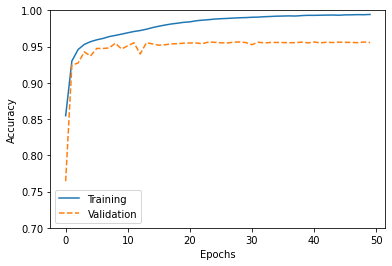

In [ ]:
history_1 = model_history.history
acc=history_1['accuracy']
val_acc = history_1['val_accuracy']



plt.plot(acc[:150], '-', label='Training')
plt.plot(val_acc[:150], '--', label='Validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim([0.7,1.0])
plt.legend()
plt.show()

# Dice Score and IOU

In [ ]:
IOU = Intersection over union
m = tf.keras.metrics.MeanIoU(num_classes=9)

In [ ]:
def dice_coef1(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    #print(tf.reduce_sum(y_true_f).numpy(), tf.reduce_sum(y_pred_f).numpy())
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)



In [ ]:
# Dice Scores for segmentation
n_classes=9
dfs = {}
for i in range(n_classes):
  dfs[i]=[]

for test_img_number in range(len(test_paths)):

  test_img = test_images[test_img_number]
  img_mask = test_masks[test_img_number]

  predicted_img = np.squeeze(create_mask(model.predict(test_images[test_img_number][tf.newaxis, ...])).numpy())

  img_mask_exp = np.zeros((SIZE_X, SIZE_Y, n_classes))
  img_pred_exp = np.zeros((SIZE_X, SIZE_Y, n_classes))
  for i in range(n_classes):
    #print(test_img_number, i)
    img_mask_exp[:,:,i][img_mask==i]=1
    img_pred_exp[:,:,i][predicted_img==i]=1
    df = dice_coef1(img_mask_exp[:,:,i], img_pred_exp[:,:,i]).numpy()
    dfs[i].append(df)

dfss = []
for i in range(n_classes):
  avg = sum(dfs[i]) / len(dfs[i])
  print(f"Dice score of {str(i)}: {str(avg)}")
  dfss.append(avg)

# Kaggle

In [ ]:
!pip install kaggle
!mkdir ~/.kaggle
!touch ~/.kaggle/kaggle.json

In [ ]:

api_token = {"username":"---","key":"---"}

import json

with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)

!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d rajkumarl/people-clothing-segmentation

In [ ]:
!unzip people-clothing-segmentation.zip -d data